# Bank Data : Implemeenting Scoring Model

Taken from https://s3-eu-west-1.amazonaws.com/static.oc-static.com/prod/courses/files/Parcours_data_scientist/Projet+-+Impl%C3%A9menter+un+mod%C3%A8le+de+scoring/Projet+Mise+en+prod+-+home-credit-default-risk.zip

The financial company “Prêt à dépenser” seeks to assess the creditworthiness of customers wishing to take out consumer credit. The aim of the project is to establish a score for each customer based on various banking information, enabling the company to decide whether or not to grant a loan accordingly.

Local and global explanations of the scoring model must be provided

## Reminder of the mission
To build a scoring model that will automatically predict the probability of a customer going bankrupt.


Just as a reminder :
- data_train.csv and data_test.csv are enriched dataframes where:
  - each categorical feature with modalities number <= 2 has been transformed to binar variable (0 or 1)
  - each categorical features with modalities number > 2 has been transformed to several binar variables (using hot-one encoding)
  - missing values have been converted to median value
  - each variable has been scaled to a [0,1] scale

  - train.csv and test.csv have the same enrichments except missing values have not been estimated



## Modelling code
In the Jupyter notebook we looked at exploration and data pre-processing. Here we'll be using a GPU to perform the Catboost, LightGBM & XGBoost modelling. Here we're on Google Colab PRO, so access to the GPU is unlimited... _The free offer doesn't allow us to carry out this project, and the limits were quickly reached for carrying out the various tests._

In [1]:
gpu_use = False

### Enabling GPU (optionnal)

In [2]:
# GPU activation test
# If the GPU is enabled, it will give the following output - '/ device: GPU: 0 '
if gpu_use:
  import tensorflow as tf
  tf.test.gpu_device_name ()

In [3]:
# Devices used when running the notebook in the cloud
if gpu_use:
  from tensorflow.python.client import device_lib
  device_lib.list_local_devices ()

In [4]:
# Imperative in order to be able to run LightGBM  on GPU
# Based on https://github.com/microsoft/LightGBM/issues/6199
if gpu_use:
  !mkdir -p /etc/OpenCL/vendors && echo "libnvidia-opencl.so.1" > /etc/OpenCL/vendors/nvidia.icd

### Libraries

In [5]:
#Download files from google drive
from google.colab import drive
drive.mount('/content/drive')
import os
os.chdir("/content/drive/MyDrive/Colab_Notebooks/Project_4")
os.listdir()
# print(f'Working directory: {os.getcwd()}')

Mounted at /content/drive


['p7_01_eda_notebook.ipynb',
 'functions',
 'input',
 'start-here-a-gentle-introduction.ipynb',
 'scoring_model.ipynb',
 'merged_data.zip',
 'train.zip',
 'test.zip',
 'data_train.zip',
 'data_test.zip',
 'TARGET.csv',
 'catboost_info',
 'p7_02_modelisation_notebook.ipynb',
 'EDA.ipynb',
 'MODEL.ipynb']

In [6]:
#RAM check
!cat /proc/meminfo

MemTotal:       13290460 kB
MemFree:         6844504 kB
MemAvailable:   11896872 kB
Buffers:          318160 kB
Cached:          4856760 kB
SwapCached:            0 kB
Active:           702268 kB
Inactive:        5367064 kB
Active(anon):       1288 kB
Inactive(anon):   894900 kB
Active(file):     700980 kB
Inactive(file):  4472164 kB
Unevictable:          20 kB
Mlocked:              20 kB
SwapTotal:             0 kB
SwapFree:              0 kB
Dirty:             11060 kB
Writeback:             0 kB
AnonPages:        894592 kB
Mapped:           382668 kB
Shmem:              1624 kB
KReclaimable:     204628 kB
Slab:             250416 kB
SReclaimable:     204628 kB
SUnreclaim:        45788 kB
KernelStack:        7448 kB
PageTables:        15976 kB
SecPageTables:         0 kB
NFS_Unstable:          0 kB
Bounce:                0 kB
WritebackTmp:          0 kB
CommitLimit:     6645228 kB
Committed_AS:    3715608 kB
VmallocTotal:   34359738367 kB
VmallocUsed:       13800 kB
VmallocChunk:    

---

In [10]:
# can be necessary to use catboost (uses old numpy version)
# needs to relaunch session
import sys
!{sys.executable} -m pip install --force-reinstall numpy==1.26.4

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 23.3 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 2.0.2
    Uninstalling numpy-2.0.2:
      Successfully uninstalled numpy-2.0.2


In [ ]:
# !pip uninstall -y numpy
# !pip install --no-cache-dir numpy==1.26.4

In [ ]:
import numpy as np
np.__version__

'1.26.4'

In [11]:
!pip install catboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.7/98.7 MB 7.5 MB/s eta 0:00:00


In [7]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import time, pickle

# Splitting datasets and performing cross-validation tools to manage data splitting and stratified evaluation
from sklearn.model_selection import train_test_split, StratifiedKFold
# Oversampling techniques to handle class imbalance and generate synthetic samples
from imblearn.over_sampling import SMOTE
# Metrics for evaluating classification models on various performance aspects
from sklearn.metrics import accuracy_score, roc_auc_score, f1_score, precision_score, recall_score
from sklearn.metrics import classification_report, confusion_matrix, roc_curve
# Pipelines for automating preprocessing and model training workflows
from imblearn.pipeline import make_pipeline, Pipeline
# Tools for cross-validation, scoring, and evaluating learning dynamics of models
from sklearn.model_selection import cross_val_predict, cross_val_score, learning_curve, cross_validate, GridSearchCV
# Recursive feature elimination to optimize feature selection with cross-validation
from sklearn.feature_selection import RFECV

import warnings
warnings.filterwarnings("ignore")

In [8]:
from sklearn.metrics import accuracy_score, roc_auc_score, f1_score, precision_score, recall_score, classification_report, confusion_matrix, roc_curve

In [9]:
plt.style.use('fivethirtyeight')
plt.rcParams.update(
    {
     'xtick.labelsize':15,
     'ytick.labelsize':15,
     'axes.labelsize': 15,
     'legend.fontsize': 15,
     'axes.titlesize':15,
     'axes.titleweight':'bold',
     'axes.titleweight':'bold'
    })

In [10]:
data_train = pd.read_csv("./data_train.zip", compression='zip', encoding='utf-8')
data_train.shape

(307511, 316)

In [11]:
TARGET = pd.read_csv('./TARGET.csv', index_col='SK_ID_CURR')
TARGET.shape

(307511, 1)

In [12]:
X_train, X_test, y_train, y_test = train_test_split(data_train.values, TARGET.values, test_size=0.2, random_state=42, stratify=TARGET.values )

In [13]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((246008, 316), (61503, 316), (246008, 1), (61503, 1))

In [14]:
import sys
import os

# Obtain the absolute path of the current notebook
notebook_path = os.path.abspath('')
# Build the path to the "functions" folder
functions_path = os.path.join(notebook_path, 'functions')
# Add the path of the root folder AND the "functions" folder to the Python path
sys.path.extend([notebook_path, functions_path])  # Using extend to add several paths

from machine_learning_functions import cf_matrix_roc_auc

In [74]:
data_train[data_train['FLAG_DOCUMENT_10']==1]

,Unnamed: 0,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,...,HOUSETYPE_MODE_terraced house,WALLSMATERIAL_MODE_Block,WALLSMATERIAL_MODE_Mixed,WALLSMATERIAL_MODE_Monolithic,WALLSMATERIAL_MODE_Others,WALLSMATERIAL_MODE_Panel,"WALLSMATERIAL_MODE_Stone, brick",WALLSMATERIAL_MODE_Wooden,EMERGENCYSTATE_MODE_No,EMERGENCYSTATE_MODE_Yes
28723,28723,0.0,0.001320,0.039326,0.033187,0.040404,0.147830,0.844081,0.907995,0.708293,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
60622,60622,0.0,0.000935,0.039326,0.033187,0.102132,0.245631,0.336528,0.946516,0.737638,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
107774,107774,0.0,0.000742,0.050562,0.041962,0.051627,0.392880,0.241375,0.890855,0.911276,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
155351,155351,0.0,0.001897,0.084270,0.068287,0.085297,0.118752,0.712627,0.858531,0.877270,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
169324,169324,0.0,0.001704,0.067416,0.055125,0.068462,0.392880,0.459583,0.949084,0.959995,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
181877,181877,0.0,0.001127,0.073034,0.059512,0.074074,0.256321,0.624803,0.839661,0.682069,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
266339,266339,0.0,0.001704,0.157303,0.125325,0.158249,1.000000,0.214600,0.982247,0.769942,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0


### **Baseline model - Logistic Regression**
The project involves gaining a better understanding of the credit defaults encountered by certain customers, anticipating them, estimating them, etc. The prediction can be summed up by a binary output, a credit acceptance or a credit refusal. To get an initial idea of possible performance, logistic regression modelling can be used to obtain a baseline.

In [ ]:
from sklearn.linear_model import LogisticRegression

In [ ]:
models = []
# class_weight: Handles class imbalance.
#    'balanced': Auto-adjust weights by class frequency.
#    dict: Manually set class weights (e.g., {0: 1, 1: 2}).
for class_weight in [None, 'balanced']: # default value is None
  # penalty: Type of regularization ('l1', 'l2', 'elasticnet', 'none').
  #    'l1': Sparse solutions, 'l2': Ridge-like, 'elasticnet': Mix of L1/L2 (requires 'saga').
  for penalty in ['l2', None]: # avoid l1 +  solver='saga' since convergence takes much more time here. default value is None
    # C: Controls regularization strength (inverse).
    #    Higher values reduce regularization (risk of overfitting).
    #    Lower values increase regularization (better generalization).
    for c in [0.0001, 0.5, 1]: # default value is 1
      if penalty == 'l1': # saga solver is mandatory for penalty == 'l1'
        models.append(LogisticRegression(solver = 'saga', C = c, penalty = penalty, class_weight = class_weight, max_iter=1000))
      else:
        models.append(LogisticRegression(C = c, penalty = penalty, class_weight = class_weight, max_iter=100))

#### First Try (unbalanced data)

In [ ]:
models

[LogisticRegression(C=0.0001),
 LogisticRegression(C=0.5),
 LogisticRegression(C=1),
 LogisticRegression(C=0.0001, penalty=None),
 LogisticRegression(C=0.5, penalty=None),
 LogisticRegression(C=1, penalty=None),
 LogisticRegression(C=0.0001, class_weight='balanced'),
 LogisticRegression(C=0.5, class_weight='balanced'),
 LogisticRegression(C=1, class_weight='balanced'),
 LogisticRegression(C=0.0001, class_weight='balanced', penalty=None),
 LogisticRegression(C=0.5, class_weight='balanced', penalty=None),
 LogisticRegression(C=1, class_weight='balanced', penalty=None)]

AUC : 0.6602
              precision    recall  f1-score   support

         0.0       0.92      1.00      0.96     56538
         1.0       0.00      0.00      0.00      4965

    accuracy                           0.92     61503
   macro avg       0.46      0.50      0.48     61503
weighted avg       0.85      0.92      0.88     61503

AUC : 0.7147
              precision    recall  f1-score   support

         0.0       0.92      1.00      0.96     56538
         1.0       0.43      0.01      0.01      4965

    accuracy                           0.92     61503
   macro avg       0.68      0.50      0.49     61503
weighted avg       0.88      0.92      0.88     61503

AUC : 0.7166
              precision    recall  f1-score   support

         0.0       0.92      1.00      0.96     56538
         1.0       0.47      0.00      0.00      4965

    accuracy                           0.92     61503
   macro avg       0.69      0.50      0.48     61503
weighted avg       0.88      0.92  

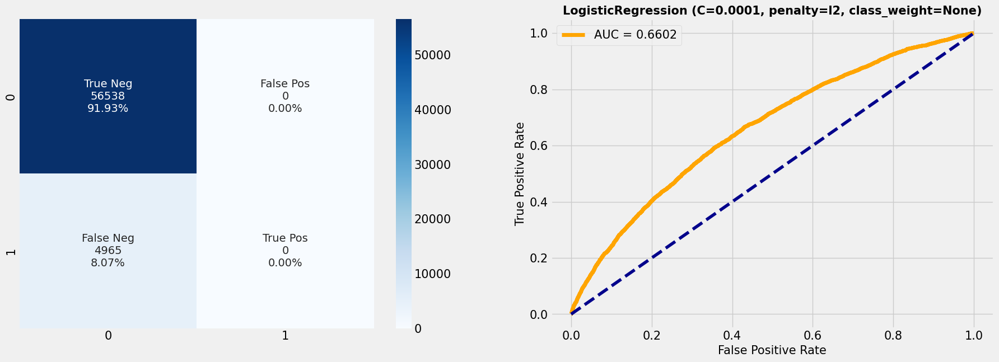

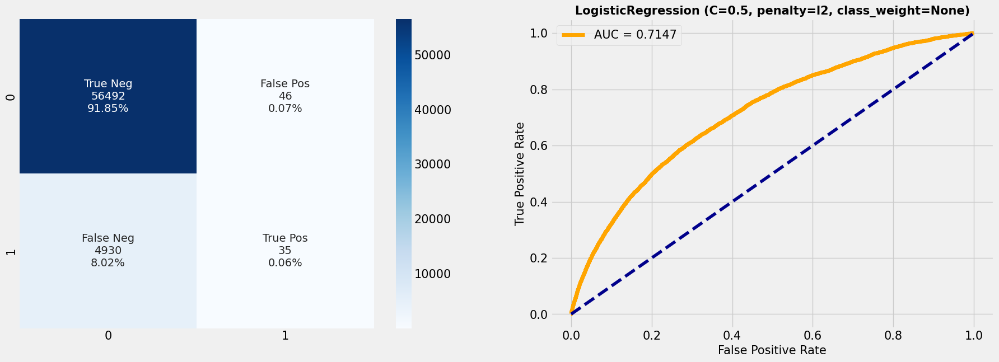

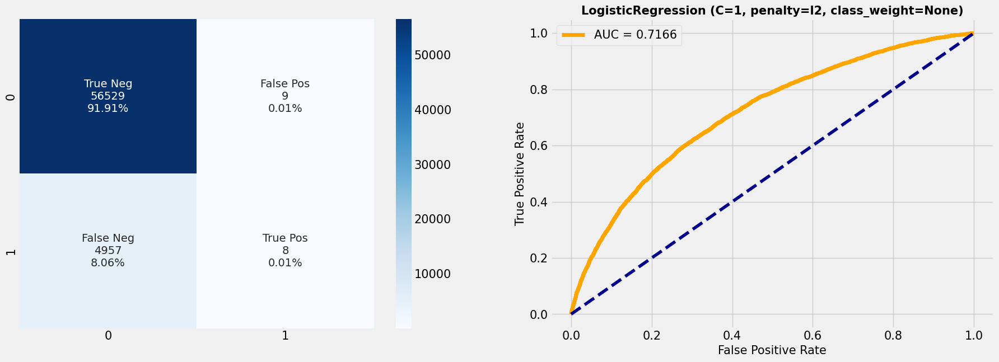

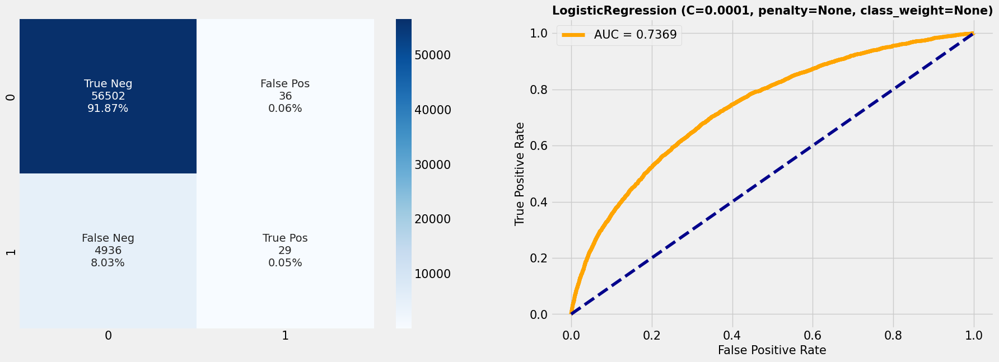

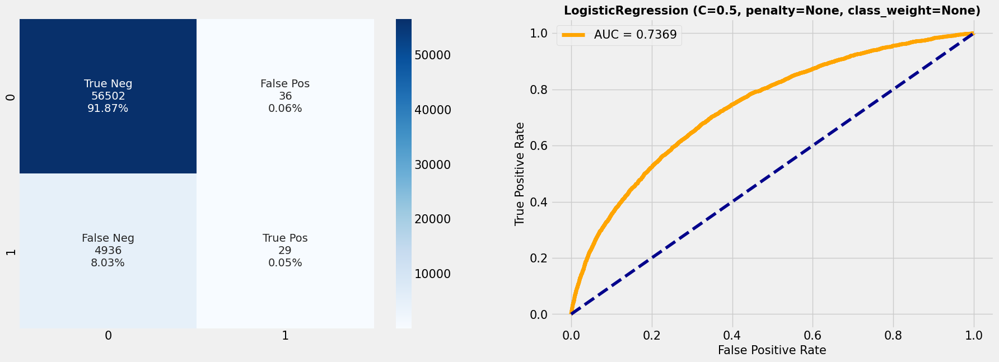

...

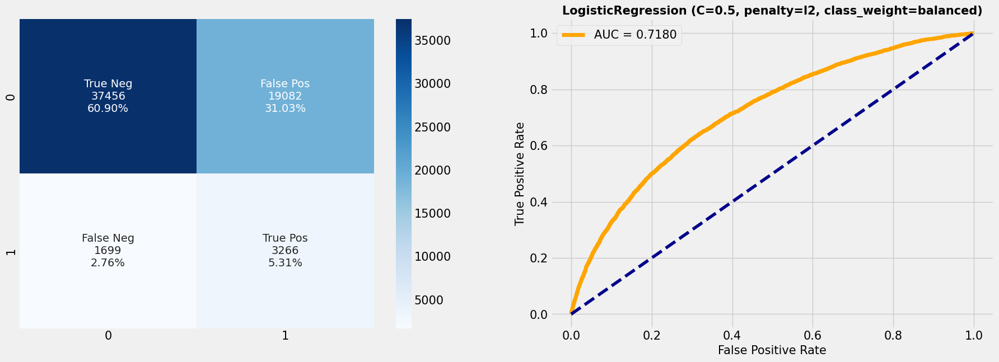

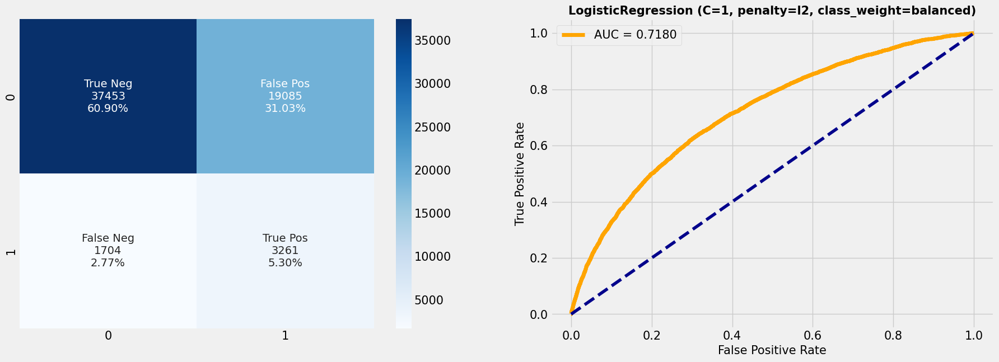

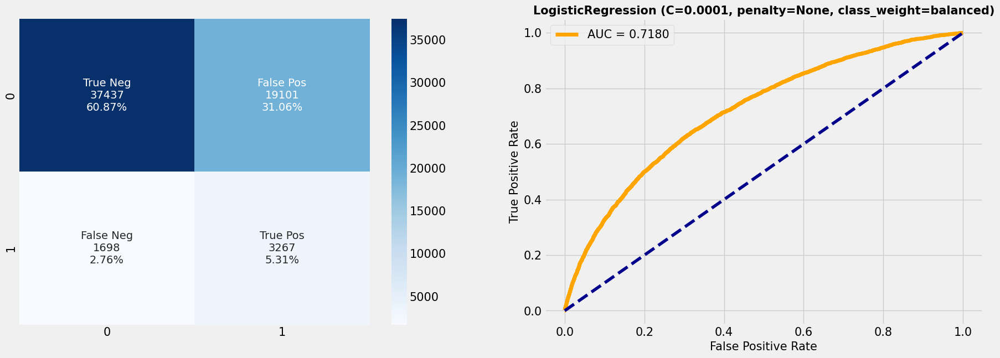

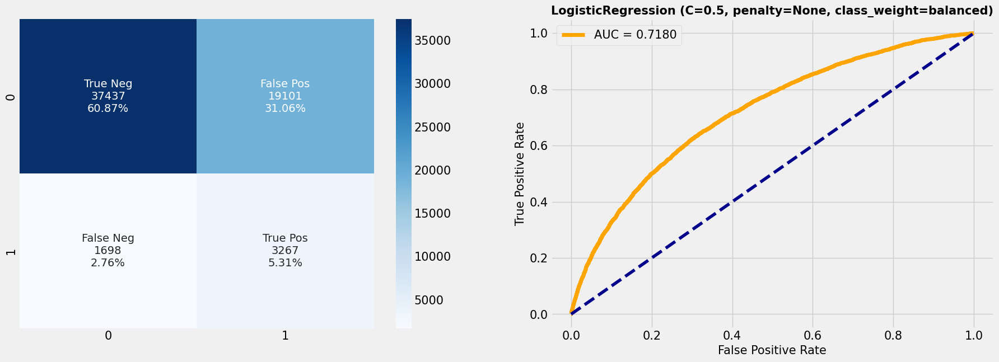

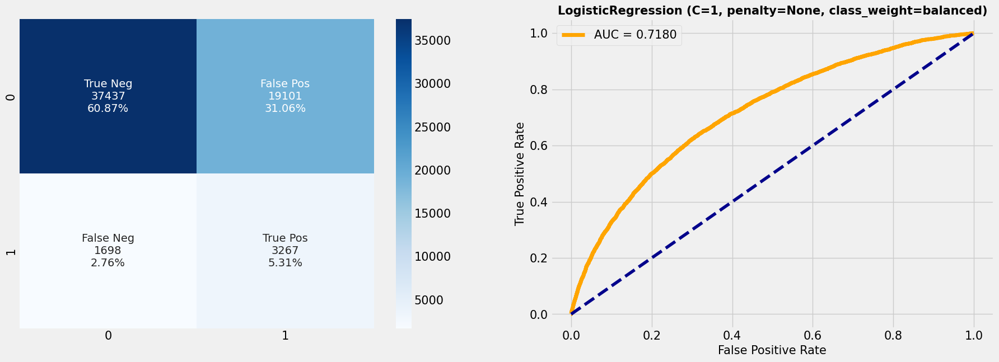

In [ ]:
%%time
for lr in models:
  lr.fit(X_train, y_train)
  roc_auc = roc_auc_score(y_test, lr.predict_proba(X_test)[:,1])
  print('AUC : %0.4f' %roc_auc)
  print(classification_report(y_test, lr.predict(X_test)))
  cf_matrix_roc_auc(lr, y_test, lr.predict(X_test), lr.predict_proba(X_test)[:,1], roc_auc)

It seems that enabling "balanced" class_weight is not really improving the AUC but it is reducing the number of False negatives

There is a marked imbalance between the precision found for Target 0 (~92% true negative) and Target 1 (0% true positive). As a reminder, the working sample is unbalanced, with 92% of individuals classified in modality 0 and 8% in modality 1, i.e. in credit default...

It is therefore interesting to work on this Oversampling by adjusting the class distribution so as to have a more egalitarian distribution.

#### Oversampling Data Using SMOTE

SMOTE with Imbalance Data using imblearn module



In [ ]:
print("Label 1, Before using SMOTE: {} ".format(sum(y_train==1)))
print("Label 0, Before using SMOTE: {} ".format(sum(y_train==0)))

Label 1, Before using SMOTE: [19860] 


In [ ]:
%%time
sm = SMOTE(random_state=2)
X_train_res, y_train_res = sm.fit_resample(X_train, y_train)

CPU times: user 13.4 s, sys: 8.06 s, total: 21.5 s
Wall time: 23.2 s


In [ ]:
print("Label 1, After using SMOTE: {}".format(sum(y_train_res==1)))
print("Label 0, After using SMOTE: {}".format(sum(y_train_res==0)))

Label 1, After using SMOTE: 226148
Label 0, After using SMOTE: 226148


#### Second Try (balanced data)

AUC : 0.7151
              precision    recall  f1-score   support

         0.0       0.96      0.66      0.78     56538
         1.0       0.14      0.66      0.24      4965

    accuracy                           0.66     61503
   macro avg       0.55      0.66      0.51     61503
weighted avg       0.89      0.66      0.74     61503

AUC : 0.7175
              precision    recall  f1-score   support

         0.0       0.96      0.67      0.79     56538
         1.0       0.15      0.65      0.24      4965

    accuracy                           0.67     61503
   macro avg       0.55      0.66      0.51     61503
weighted avg       0.89      0.67      0.74     61503

AUC : 0.7175
              precision    recall  f1-score   support

         0.0       0.96      0.67      0.79     56538
         1.0       0.15      0.65      0.24      4965

    accuracy                           0.67     61503
   macro avg       0.55      0.66      0.51     61503
weighted avg       0.89      0.67  

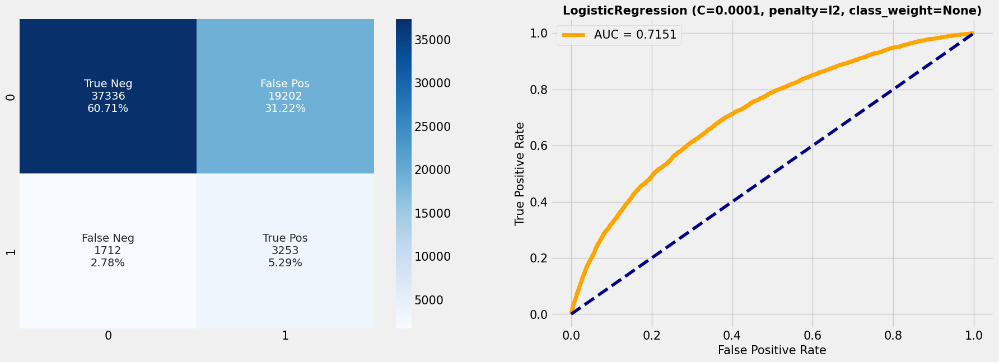

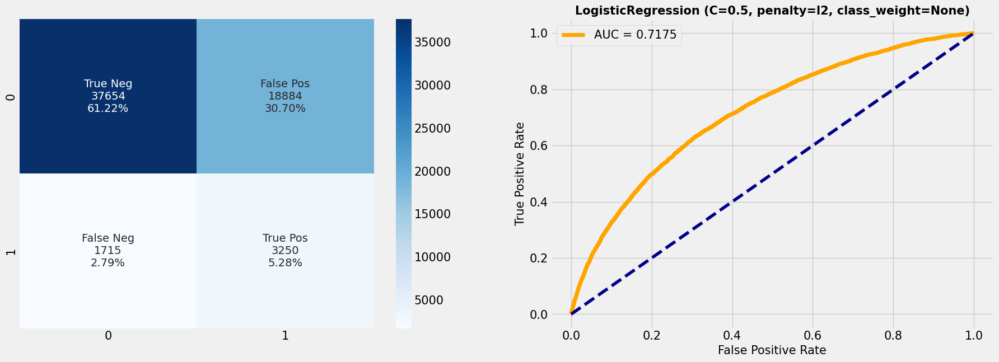

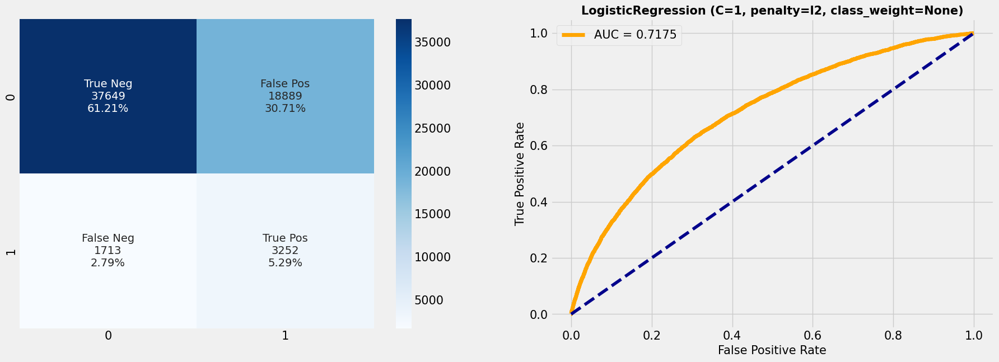

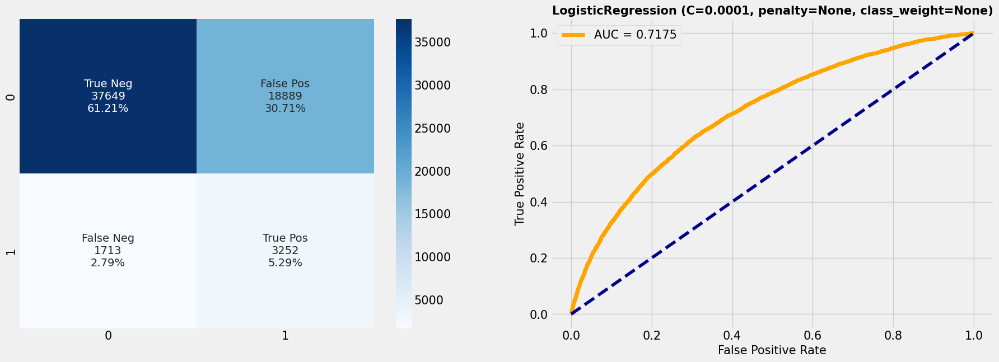

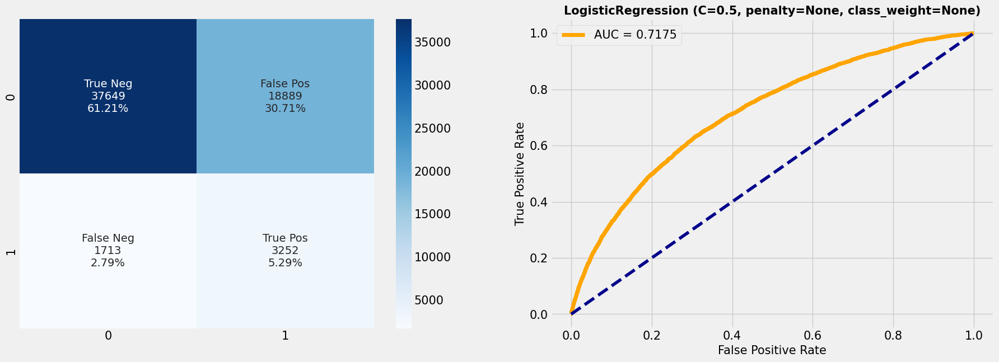

...

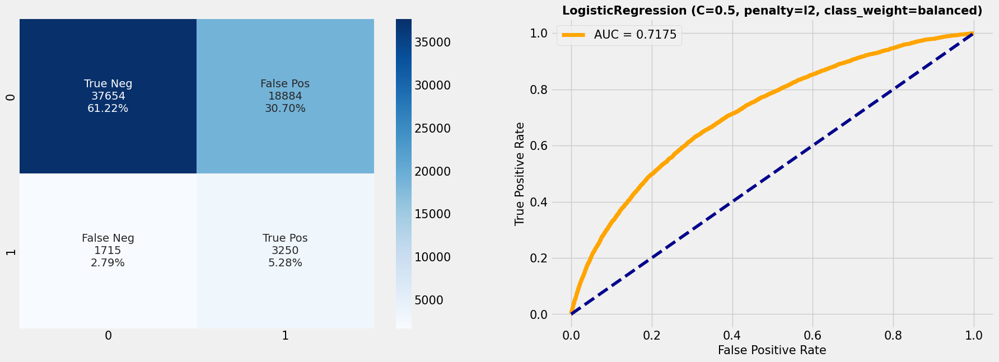

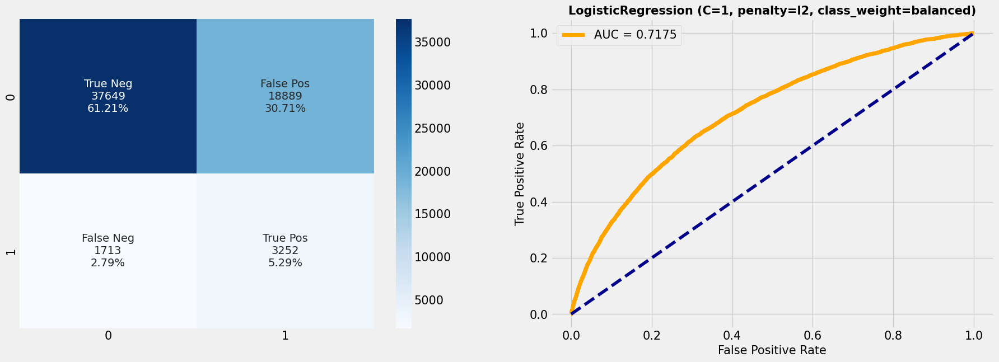

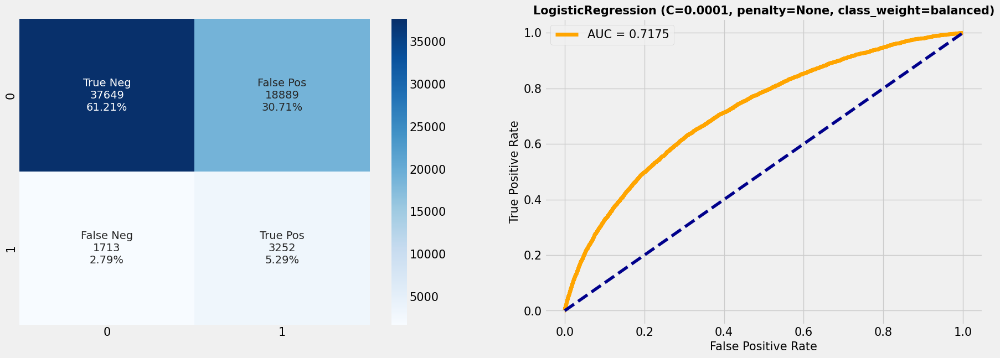

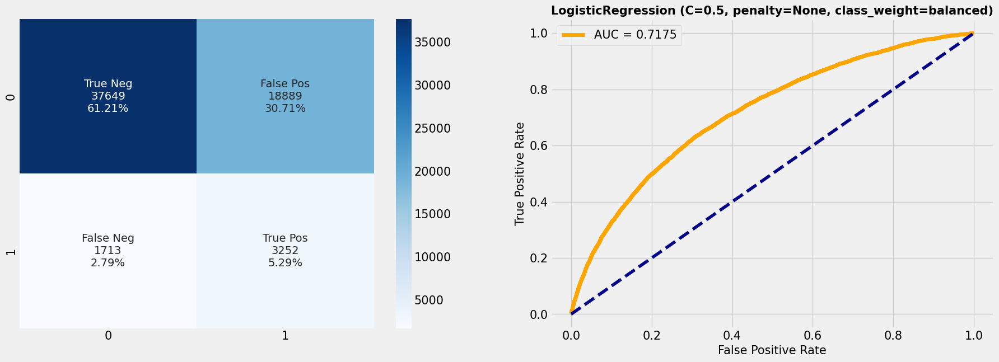

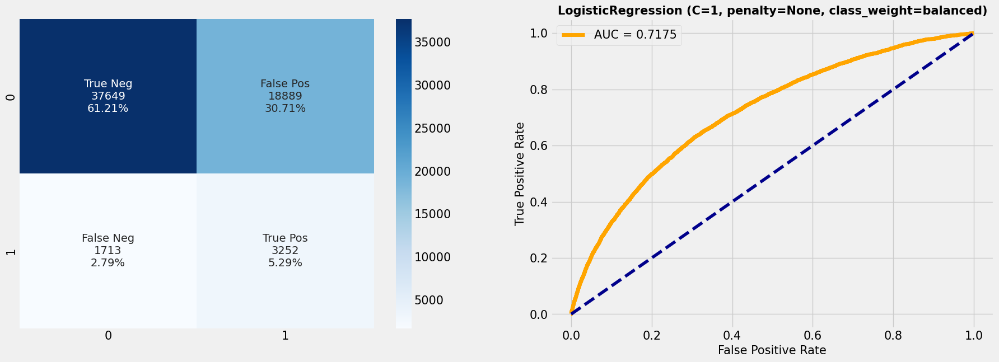

In [ ]:
%%time
for lr in models:
  lr.fit(X_train_res, y_train_res) # change here
  roc_auc = roc_auc_score(y_test, lr.predict_proba(X_test)[:,1])
  print('AUC : %0.4f' %roc_auc)
  print(classification_report(y_test, lr.predict(X_test)))
  cf_matrix_roc_auc(lr, y_test, lr.predict(X_test), lr.predict_proba(X_test)[:,1], roc_auc)

AUC score and confusion matrix are quite similiar to the previous case (unbalanced data), using the "balanced" value for "class_weight" parameter.

### **Random Forest**

In [ ]:
from sklearn.ensemble import RandomForestClassifier
# from sklearn.model_selection import GridSearchCV

In [ ]:
models = []

# Iterates over class_weight options to handle imbalance:
# - None: Equal weights for all classes (default)
# - 'balanced': Auto-weights inversely proportional to class frequencies
for class_weight in [None, 'balanced']:

    # n_estimators controls the number of trees in the forest:
    # - 25: Small ensemble (faster, less stability)
    # - 50: Balance between speed/performance
    # - 100: Default (robust but slower)
    for n_estimators in [25, 50, 100]:

        # Creates a model instance with fixed:
        # - random_state controls RNG reproducibility (seed=42)
        models.append(RandomForestClassifier(
            class_weight=class_weight,
            n_estimators=n_estimators,
            random_state=42  # Deterministic seeding for comparisons
        ))

#### First try (unbalanced data)

AUC : 0.6806
              precision    recall  f1-score   support

         0.0       0.92      1.00      0.96     56538
         1.0       0.53      0.01      0.01      4965

    accuracy                           0.92     61503
   macro avg       0.72      0.50      0.49     61503
weighted avg       0.89      0.92      0.88     61503

AUC : 0.7026
              precision    recall  f1-score   support

         0.0       0.92      1.00      0.96     56538
         1.0       0.65      0.00      0.00      4965

    accuracy                           0.92     61503
   macro avg       0.78      0.50      0.48     61503
weighted avg       0.90      0.92      0.88     61503

AUC : 0.7189
              precision    recall  f1-score   support

         0.0       0.92      1.00      0.96     56538
         1.0       0.89      0.00      0.00      4965

    accuracy                           0.92     61503
   macro avg       0.90      0.50      0.48     61503
weighted avg       0.92      0.92  

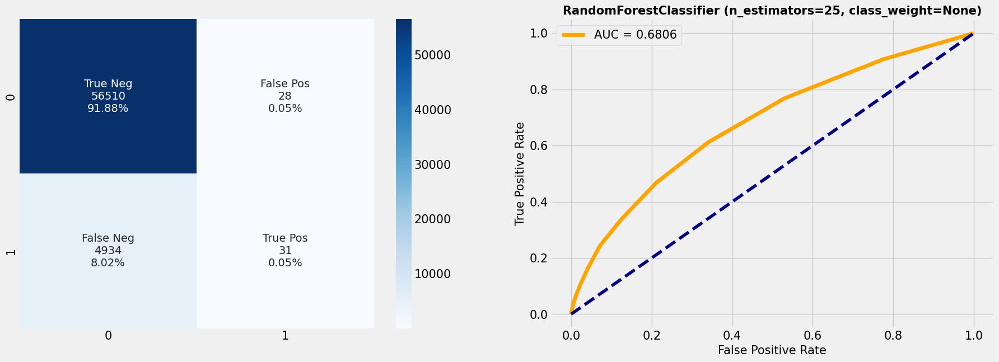

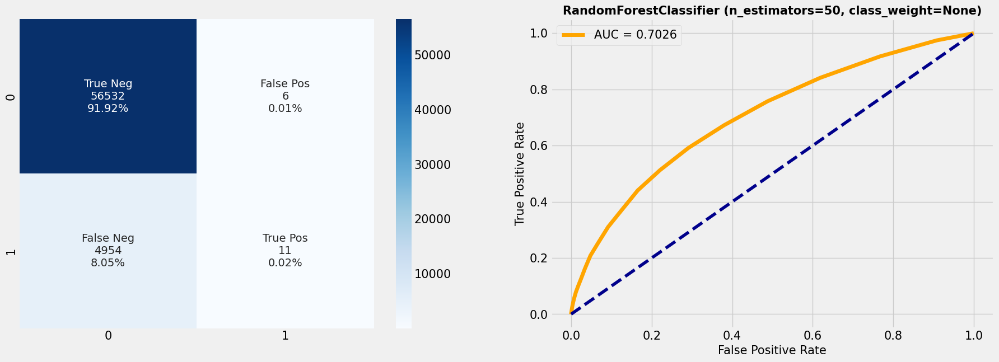

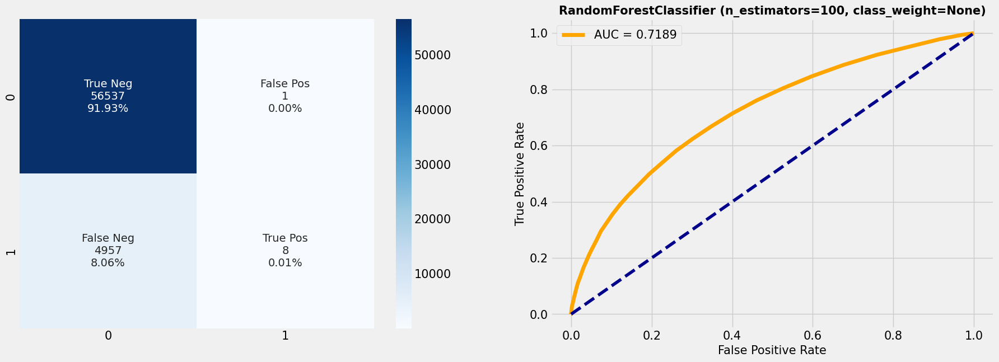

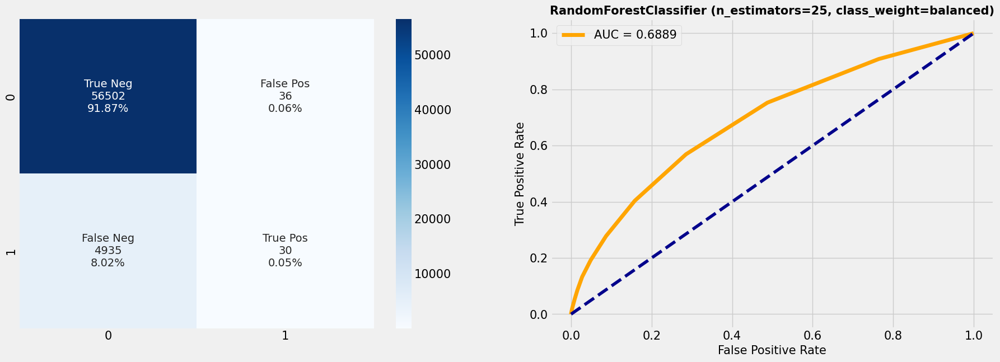

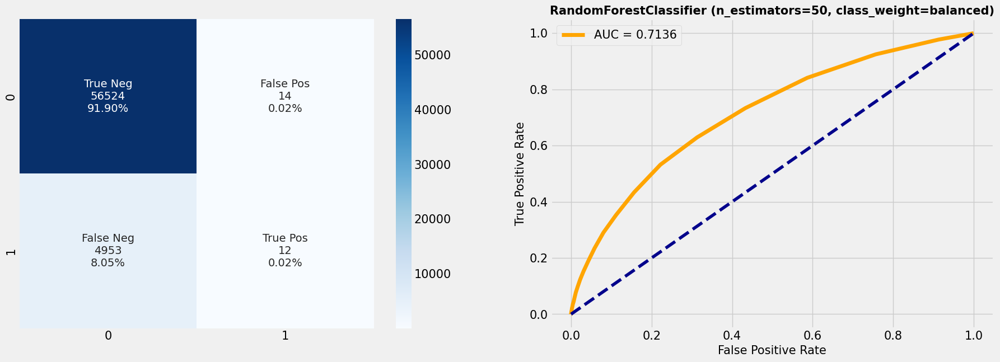

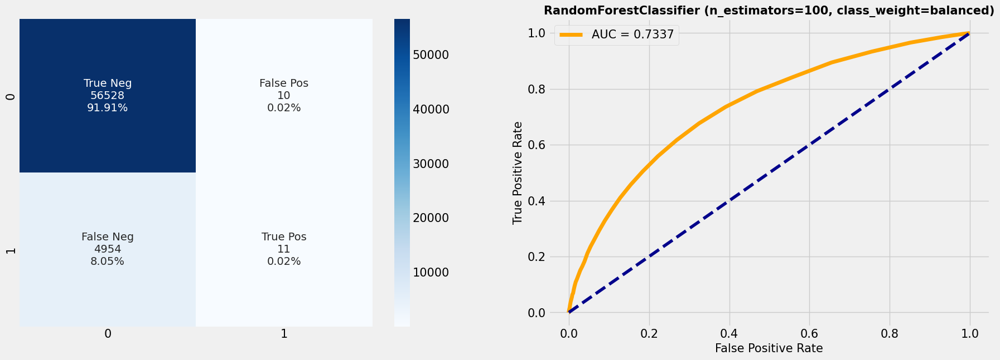

In [ ]:
%%time
for rf in models:
  rf.fit(X_train, y_train)
  roc_auc = roc_auc_score(y_test, rf.predict_proba(X_test)[:,1])
  print('AUC : %0.4f' %roc_auc)
  print(classification_report(y_test, rf.predict(X_test)))
  cf_matrix_roc_auc(rf, y_test, rf.predict(X_test), rf.predict_proba(X_test)[:,1], roc_auc)

As we can see, the AUC value is maximal with higher n_estimators value and balanced class weights

#### Second Try (balanced data)

AUC : 0.6734
              precision    recall  f1-score   support

         0.0       0.92      1.00      0.96     56538
         1.0       0.34      0.01      0.01      4965

    accuracy                           0.92     61503
   macro avg       0.63      0.50      0.48     61503
weighted avg       0.87      0.92      0.88     61503

AUC : 0.6936
              precision    recall  f1-score   support

         0.0       0.92      1.00      0.96     56538
         1.0       0.36      0.00      0.00      4965

    accuracy                           0.92     61503
   macro avg       0.64      0.50      0.48     61503
weighted avg       0.87      0.92      0.88     61503

AUC : 0.7078
              precision    recall  f1-score   support

         0.0       0.92      1.00      0.96     56538
         1.0       0.50      0.00      0.00      4965

    accuracy                           0.92     61503
   macro avg       0.71      0.50      0.48     61503
weighted avg       0.89      0.92  

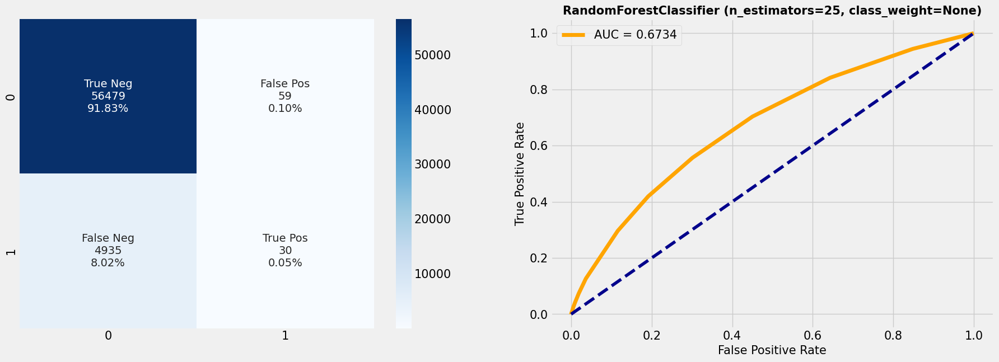

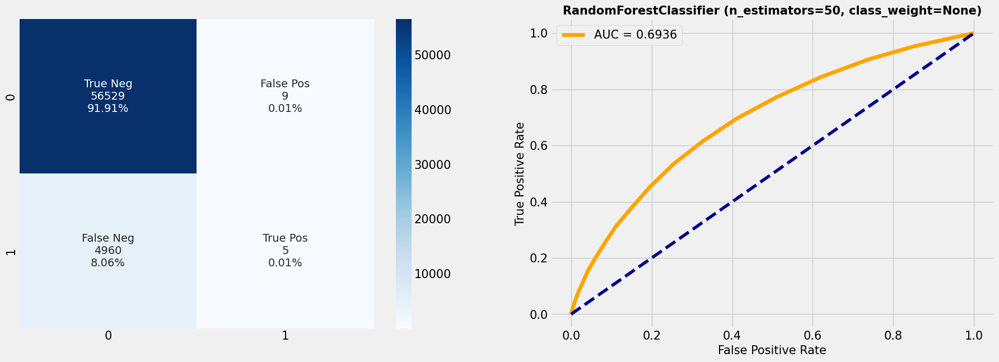

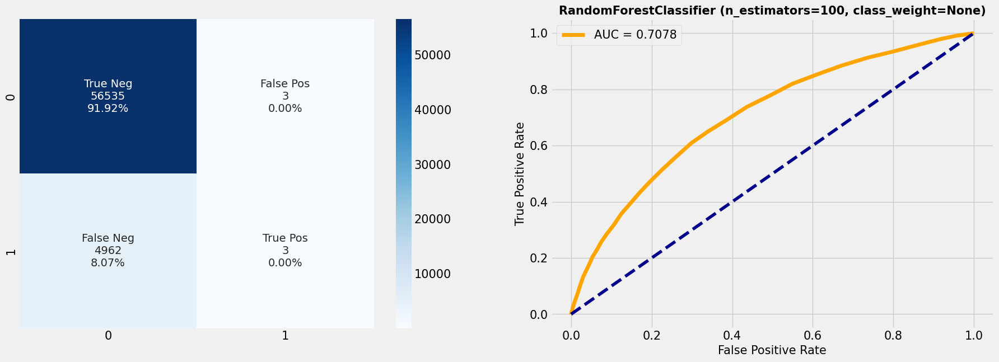

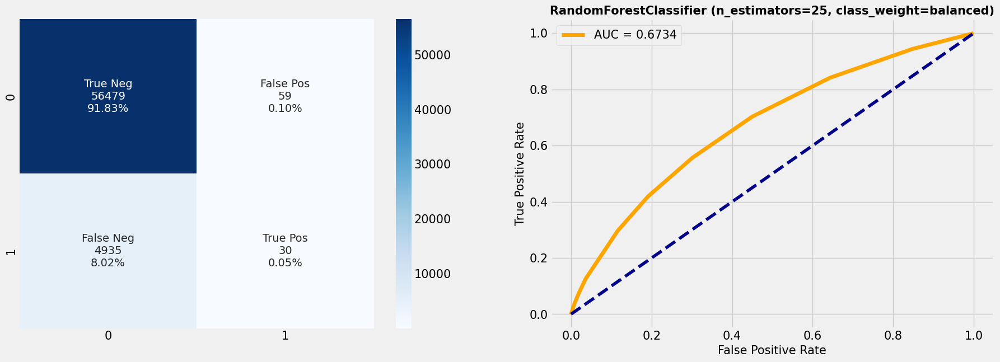

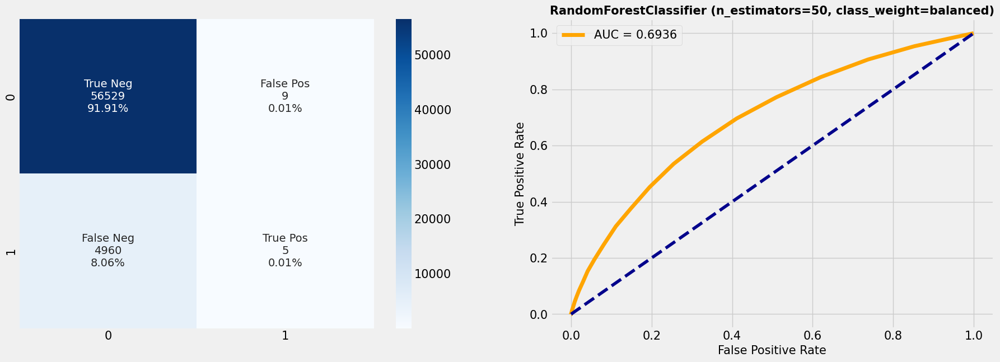

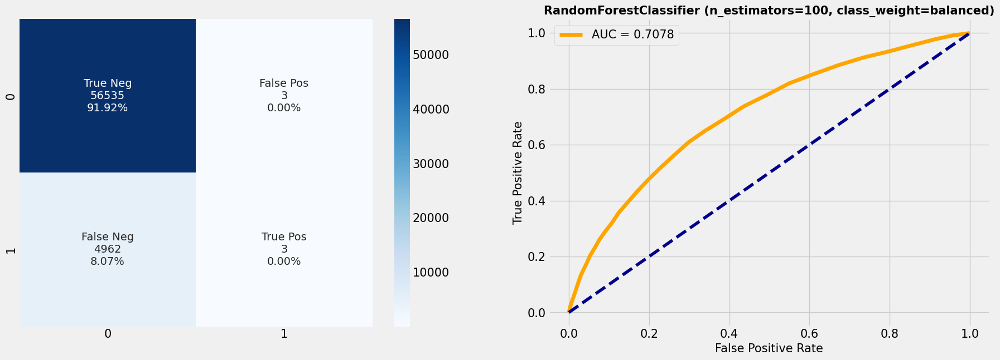

In [ ]:
%%time
for rf in models:
  rf.fit(X_train_res, y_train_res)
  roc_auc = roc_auc_score(y_test, rf.predict_proba(X_test)[:,1])
  print('AUC : %0.4f' %roc_auc)
  print(classification_report(y_test, rf.predict(X_test)))
  cf_matrix_roc_auc(rf, y_test, rf.predict(X_test), rf.predict_proba(X_test)[:,1], roc_auc)

These results are interesting since they are showing that using SMOTE data brings worse results : data are noised.

### **Gradient Boosting**

#### Instantiation of different models (hyperparameters tuning)

In [15]:
# Modify option to display all characters
pd.set_option('display.max_colwidth', None)

In [15]:
#Predictive Models
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier

In [ ]:
xgboost_models = []

# Parameter 1: max_depth (default: 6)
#    ↓ Shallow trees = prevent overfit, ↑ Deep trees = capture interactions
# for max_depth in [6, 3]:  # Baseline (6) + 2 variations [simplify (3), complex (10)]
for max_depth in [6, 3, 10]:  # Baseline (6) + 2 variations [simplify (3), complex (10)]

    # Parameter 2: learning_rate (default: 0.3)
    #    ↑ Higher = aggressive step size (use with regularization)
    #    ↓ Lower = smoother updates (requires more trees)
    # for learning_rate in [0.3, 0.1]:  # Widely tested values
    for learning_rate in [0.3, 0.1, 0.05]:  # Widely tested values

        # Parameter 3: n_estimators (default: 100)
        #    ↓ Low = underfit (high bias), ↑ High = better coverage (control with eta)
        # for n_estimators in [100, 200]:
        for n_estimators in [100, 200, 400]:

            # Balancing Technique:
            #    - Scale_pos_weight (e.g., n_neg / n_pos if classes are imbalanced)
            #    - No subsampling here to simplify configs (focus on core params)
            model = XGBClassifier(
                max_depth=max_depth,
                learning_rate=learning_rate,
                n_estimators=n_estimators,
                random_state=42  # Seed for reproducibility
            )

            if gpu_use:
              model.tree_method = 'gpu_hist'
              model.predictor = 'gpu_predictor'
            else:
              model.tree_method = 'hist'
              model.predictor = 'cpu_predictor'
            xgboost_models.append(model)


In [ ]:
lightgbm_models = []

# Parameter 1: max_depth (default: -1 = no limit)
#    Critical for avoiding overgrowth on deep trees
# for max_depth in [-1, 4]:  # Unlimited (-1) vs constrained (4, 8)
for max_depth in [-1, 4, 8]:  # Unlimited (-1) vs constrained (4, 8)

    # Parameter 2: learning_rate (default: 0.1)
    #    Commonly tuned first (tighter tolerances may help)
    # for learning_rate in [0.1, 0.05]:  # Tune if AUC plateaus
    for learning_rate in [0.1, 0.05, 0.01]:  # Tune if AUC plateaus

        # Parameter 3: num_leaves (default: 31)
        #    Directly affects tree complexity; use with max_depth
        # for num_leaves in [31, 20]:  # Test with max_depth counterparts
        for num_leaves in [31, 20, 40]:  # Test with max_depth counterparts

            # Other Features Fixed (to isolate variable effects):
            #    force_col_wise=True → Improves memory usage on datasets with many columns
            #    boosting_type='gbdt' → Default, ensures standard gradient boosting
            model = LGBMClassifier(
                max_depth=max_depth,
                learning_rate=learning_rate,
                num_leaves=num_leaves,
                random_state=42,
                force_col_wise=True,
                verbose=-1  # Suppresses training logs
            )
            if gpu_use:
              model.device='gpu'
            else:
              model.device='cpu'
            lightgbm_models.append(model)


In [ ]:
catboost_models = []

# Parameter 1: Tree Depth (default: 6)
#    ↑ Controls model capacity (shallow = less overfit, deep = higher complexity)
for depth in [6, 4]:  # Baseline (6) + 2 variations [4 (shallower), 8 (deeper)]
# for depth in [6, 4, 8]:  # Baseline (6) + 2 variations [4 (shallower), 8 (deeper)]

    # Parameter 2: Learning Rate (default: 0.03)
    #    ↓ Lower = slower convergence (better generalization)
    #    ↑ Higher = faster training (risk of plateauing)
    for learning_rate in [0.03, 0.1]:  # Test aggressive (0.1) and conservative (0.02)
    # for learning_rate in [0.03, 0.1, 0.02]:  # Test aggressive (0.1) and conservative (0.02)

        # Parameter 3: Number of Trees (default: 1000)
        #    ↓ Low = faster training (possible underfit)
        #    ↑ High = slower but captures patterns better (risk of overfit with high depth)
        for iterations in [1000, 500]:  # Baseline (1000) + 2 changes [30% reduction/increase)
        # for iterations in [1000, 500, 1500]:  # Baseline (1000) + 2 changes [30% reduction/increase)

            # Important: Disable GPU for stability on shared resources
            # Note: class_weight='balanced' is default but set explicitly if your data is imbalanced
            model = CatBoostClassifier(
                  logging_level='Silent',
                  depth=depth,
                  learning_rate=learning_rate,
                  iterations=iterations,
                  random_seed=42,  # Reproducibility
              )
            if gpu_use:
              model.task_type = "GPU"
            else:
              model.task_type = "CPU"

            catboost_models.append(model)


In [ ]:
models = np.concatenate([catboost_models, lightgbm_models, xgboost_models])

In [ ]:
len(models)

62

The following function ``train_models`` can calculate the auc, accuracy, f1, precision and recall metrics. It can be modified according to the expected needs, just refer to [Scikit-learn Classification Scoring](https://scikit-learn.org/stable/modules/model_evaluation.html#scoring-parameter).

In [ ]:
def train_models(model, X_train, X_test, y_train, y_test):
    model.fit(X_train, y_train)
    output = {
      'AUC': roc_auc_score(y_test, model.predict_proba(X_test)[:,1]),
      'Accuracy': accuracy_score(y_test, model.predict(X_test)),
      'Precision': precision_score(y_test, model.predict(X_test)),
      'Recall': recall_score(y_test, model.predict(X_test)),
      'F1': f1_score(y_test, model.predict(X_test))
      }

    return output

#### First Try (unbalanced data)

In [ ]:
%%time

name = []
auc = []
accuracy = []
precision = []
recall = []
f1 = []
time_ = []
plt_titles = []
trained_models = []

count = 0
for model in models:
    count += 1
    start = time.time()
    results = train_models(model, X_train, X_test, y_train, y_test)

    name.append(type(model).__name__)
    auc.append(results['AUC'])
    accuracy.append(results['Accuracy'])
    precision.append(results['Precision'])
    recall.append(results['Recall'])
    f1.append(results['F1'])
    time_.append(time.time()-start)
    trained_models.append(model)

    plt_title = cf_matrix_roc_auc(model, y_test, model.predict(X_test), model.predict_proba(X_test)[:,1],
                      results['AUC'])
    plt_titles.append(plt_title)
    print(f"Model {count}/{len(models)} : completed.")

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
#Initialise data of lists
base_models = pd.DataFrame(data=[name, auc, accuracy, precision, recall, f1, time_, plt_titles, trained_models]).T
base_models.columns = ['Model', 'AUC', 'Accuracy', 'Precision', 'Recall', 'F1', 'Time', 'Title','Trained_Model']
base_models.sort_values('AUC', ascending=False, inplace=True)

In [ ]:
base_models.head(15)

,Model,AUC,Accuracy,Precision,Recall,F1,Time,Title,Trained_Model
2,CatBoostClassifier,0.783059,0.920069,0.559036,0.046727,0.086245,296.546798,"CatBoostClassifier (depth=6, learning_rate=0.1, iterations=1000)",<catboost.core.CatBoostClassifier object at 0x7e7148fdc350>
6,CatBoostClassifier,0.782352,0.919955,0.55303,0.044109,0.081701,238.20094,"CatBoostClassifier (depth=4, learning_rate=0.1, iterations=1000)",<catboost.core.CatBoostClassifier object at 0x7e7148fdc410>
3,CatBoostClassifier,0.781446,0.92015,0.579882,0.039476,0.07392,194.567047,"CatBoostClassifier (depth=6, learning_rate=0.1, iterations=500)",<catboost.core.CatBoostClassifier object at 0x7e7148fdc310>
7,CatBoostClassifier,0.779609,0.919923,0.560976,0.037059,0.069526,170.738034,"CatBoostClassifier (depth=4, learning_rate=0.1, iterations=500)",<catboost.core.CatBoostClassifier object at 0x7e7148fdc490>
46,XGBClassifier,0.77935,0.920313,0.567511,0.054179,0.098915,60.542965,"XGBClassifier (max_depth=3, learning_rate=0.3, n_estimators=400)","XGBClassifier(base_score=None, booster=None, callbacks=None,\n colsample_bylevel=None, colsample_bynode=None,\n colsample_bytree=None, device=None, early_stopping_rounds=None,\n enable_categorical=False, eval_metric=None, feature_types=None,\n gamma=None, grow_policy=None, importance_type=None,\n interaction_constraints=None, learning_rate=0.3, max_bin=None,\n max_cat_threshold=None, max_cat_to_onehot=None,\n max_delta_step=None, max_depth=3, max_leaves=None,\n min_child_weight=None, missing=nan, monotone_constraints=None,\n multi_strategy=None, n_estimators=400, n_jobs=None,\n num_parallel_tree=None, random_state=42, ...)"
43,XGBClassifier,0.779308,0.920313,0.591954,0.04149,0.077546,97.091973,"XGBClassifier (max_depth=6, learning_rate=0.05, n_estimators=400)","XGBClassifier(base_score=None, booster=None, callbacks=None,\n colsample_bylevel=None, colsample_bynode=None,\n colsample_bytree=None, device=None, early_stopping_rounds=None,\n enable_categorical=False, eval_metric=None, feature_types=None,\n gamma=None, grow_policy=None, importance_type=None,\n interaction_constraints=None, learning_rate=0.05, max_bin=None,\n max_cat_threshold=None, max_cat_to_onehot=None,\n max_delta_step=None, max_depth=6, max_leaves=None,\n min_child_weight=None, missing=nan, monotone_constraints=None,\n multi_strategy=None, n_estimators=400, n_jobs=None,\n num_parallel_tree=None, random_state=42, ...)"
40,XGBClassifier,0.779116,0.919727,0.530568,0.048943,0.089618,92.349166,"XGBClassifier (max_depth=6, learning_rate=0.1, n_estimators=400)","XGBClassifier(base_score=None, booster=None, callbacks=None,\n colsample_bylevel=None, colsample_bynode=None,\n colsample_bytree=None, device=None, early_stopping_rounds=None,\n enable_categorical=False, eval_metric=None, feature_types=None,\n gamma=None, grow_policy=None, importance_type=None,\n interaction_constraints=None, learning_rate=0.1, max_bin=None,\n max_cat_threshold=None, max_cat_to_onehot=None,\n max_delta_step=None, max_depth=6, max_leaves=None,\n min_child_weight=None, missing=nan, monotone_constraints=None,\n multi_strategy=None, n_estimators=400, n_jobs=None,\n num_parallel_tree=None, random_state=42, ...)"
49,XGBClassifier,0.77901,0.919955,0.582677,0.029809,0.056716,62.146497,"XGBClassifier (max_depth=3, learning_rate=0.1, n_estimators=400)","XGBClassifier(base_score=None, booster=None, callbacks=None,\n colsample_bylevel=None, colsample_bynode=None,\n colsample_bytree=None, device=None, early_stopping_rounds=None,\n enable_categorical=False, eval_metric=None, feature_types=None,\n gamma=None, grow_policy=None, importance_type=None,\n interaction_constraints=None, learning_rate=0.1, max_bin=None,\n max_cat_threshold=None, max_cat_to_onehot=None,\n max_delta_step=None, max_depth=3, max_leaves=None,\n min_child_weight=None, missing=nan, monotone_constraints=None,\n multi_strategy=None, n_estimators=400, n_jobs=None,\n num_parallel_tree=None, random_state=42, ...)"
0,CatBoostClassifier,0.778993,0.920362

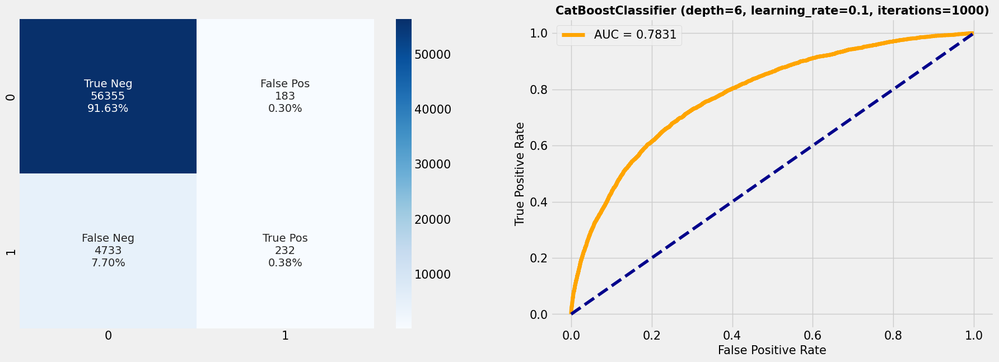

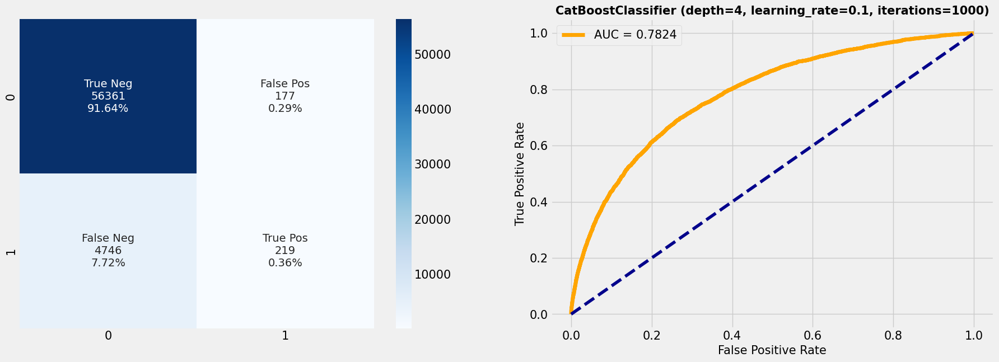

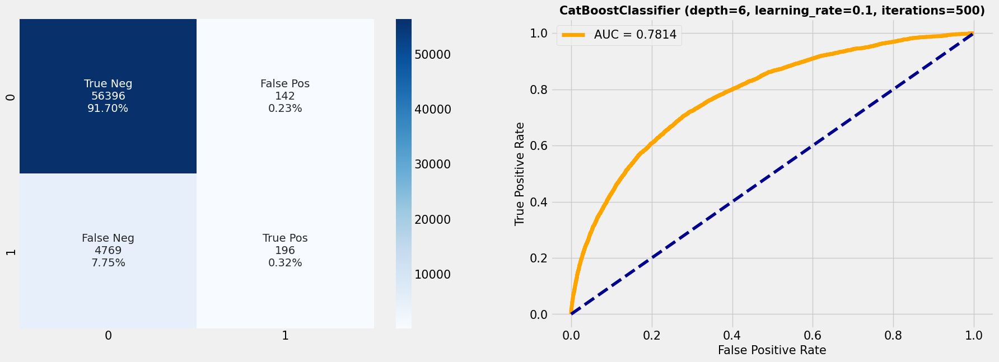

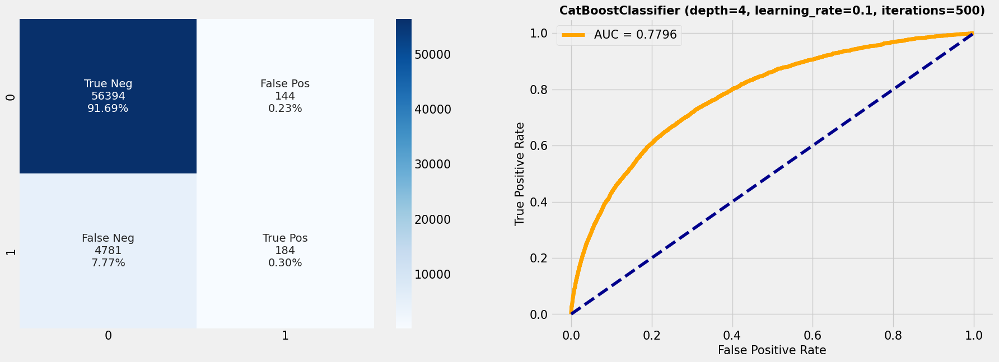

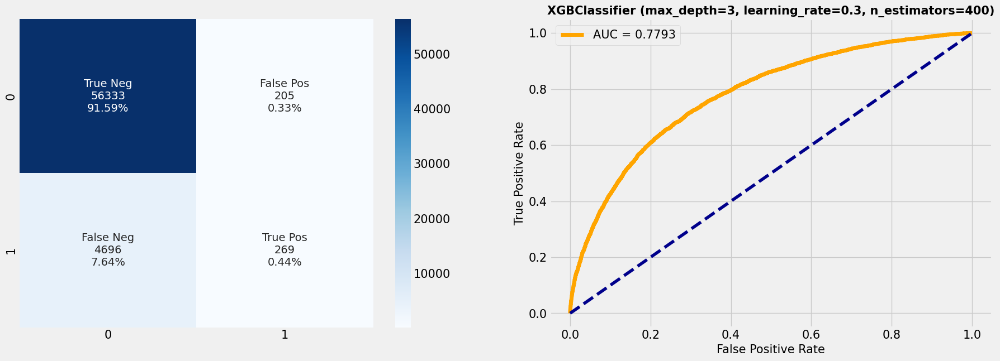

...

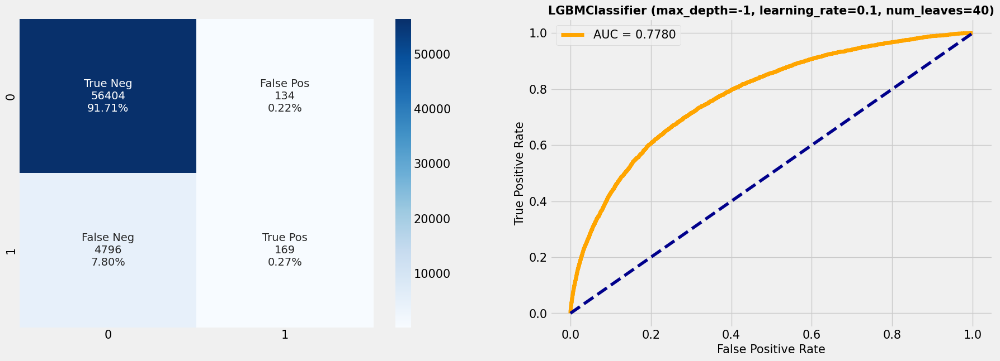

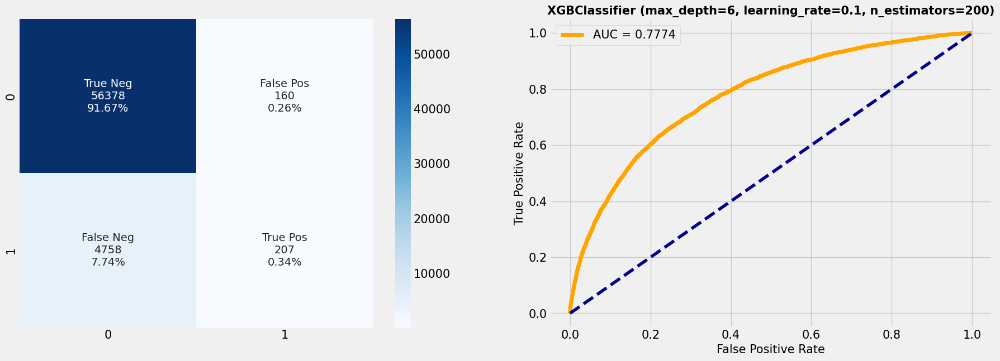

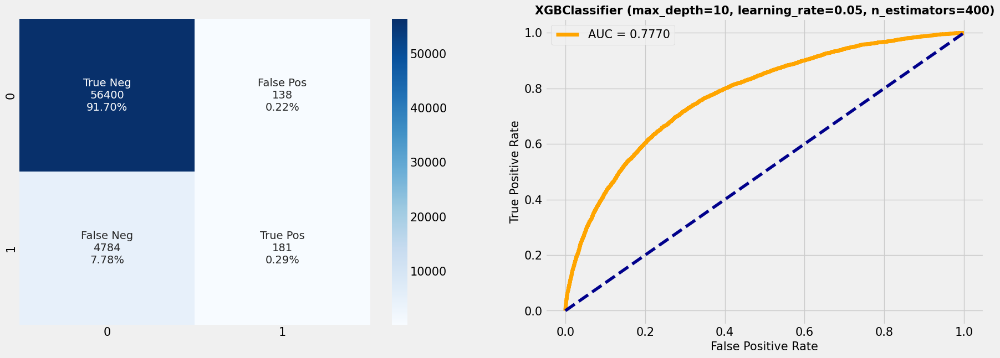

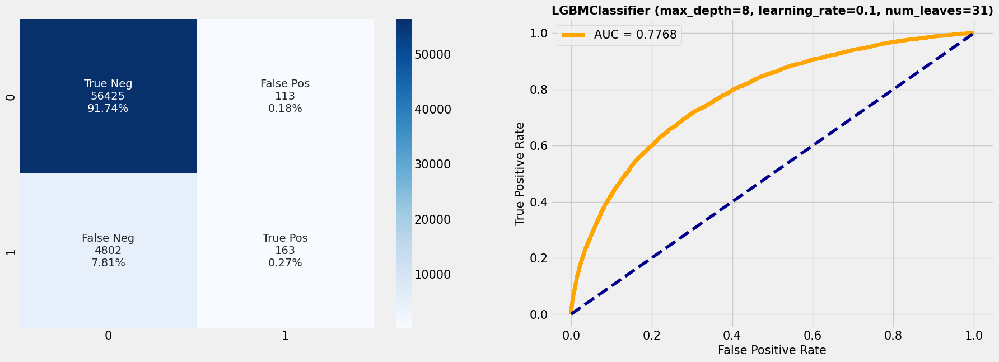

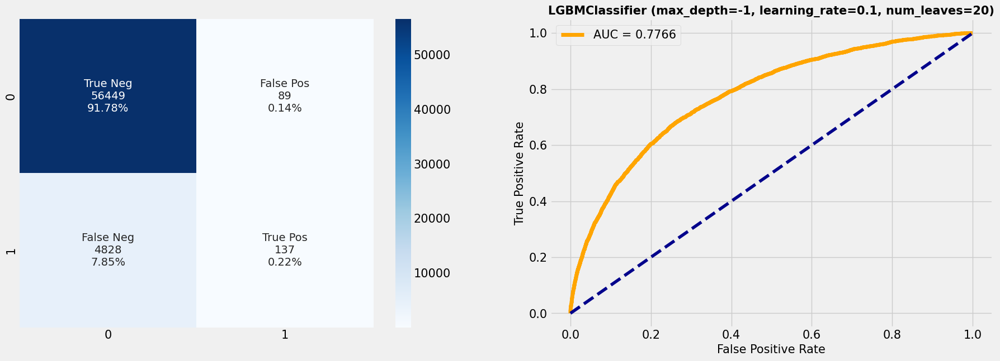

In [ ]:
for model_index in base_models.head(15)['Trained_Model'].index:
  model = base_models.head(15)['Trained_Model'][model_index]
  AUC = base_models.head(15)['AUC'][model_index]
  cf_matrix_roc_auc(model, y_test, model.predict(X_test), model.predict_proba(X_test)[:,1], AUC)

XGB has the best AUC + reasonnable Time processing. However, running the Catboost model with non-encoded variables could bring better AUC AND better time processing. We will see it later

#### Second Try (balanced data)

We're going to compare our models again, this time using SMOTE data.

In [ ]:
%%time

name = []
auc = []
accuracy = []
precision = []
recall = []
f1 = []
time_ = []
plt_titles = []
trained_models = []

count = 0
for model in models:
    count += 1
    start = time.time()
    results = train_models(model, X_train_res, X_test, y_train_res, y_test)

    name.append(type(model).__name__)
    auc.append(results['AUC'])
    accuracy.append(results['Accuracy'])
    precision.append(results['Precision'])
    recall.append(results['Recall'])
    f1.append(results['F1'])
    time_.append(time.time()-start)
    trained_models.append(model)

    plt_title = cf_matrix_roc_auc(model, y_test, model.predict(X_test), model.predict_proba(X_test)[:,1],
                      results['AUC'])
    plt_titles.append(plt_title)
    print(f"Model {count}/{len(models)} : completed.")

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
#Initialise data of lists
base_models_res = pd.DataFrame(data=[name, auc, accuracy, precision, recall, f1, time_, plt_titles, trained_models]).T
base_models_res.columns = ['Model', 'AUC', 'Accuracy', 'Precision', 'Recall', 'F1', 'Time', 'Title','Trained_Model']
base_models_res.sort_values('AUC', ascending=False, inplace=True)

In [ ]:
base_models_res.head(15)

,Model,AUC,Accuracy,Precision,Recall,F1,Time,Title,Trained_Model
6,CatBoostClassifier,0.779821,0.920329,0.588076,0.043706,0.081365,482.374802,"CatBoostClassifier (depth=4, learning_rate=0.1, iterations=1000)",<catboost.core.CatBoostClassifier object at 0x7e7148fdc410>
2,CatBoostClassifier,0.778704,0.920248,0.573529,0.04713,0.087102,612.301093,"CatBoostClassifier (depth=6, learning_rate=0.1, iterations=1000)",<catboost.core.CatBoostClassifier object at 0x7e7148fdc350>
40,XGBClassifier,0.777779,0.919793,0.536199,0.047734,0.087664,291.387834,"XGBClassifier (max_depth=6, learning_rate=0.1, n_estimators=400)","XGBClassifier(base_score=None, booster=None, callbacks=None,\n colsample_bylevel=None, colsample_bynode=None,\n colsample_bytree=None, device=None, early_stopping_rounds=None,\n enable_categorical=False, eval_metric=None, feature_types=None,\n gamma=None, grow_policy=None, importance_type=None,\n interaction_constraints=None, learning_rate=0.1, max_bin=None,\n max_cat_threshold=None, max_cat_to_onehot=None,\n max_delta_step=None, max_depth=6, max_leaves=None,\n min_child_weight=None, missing=nan, monotone_constraints=None,\n multi_strategy=None, n_estimators=400, n_jobs=None,\n num_parallel_tree=None, random_state=42, ...)"
46,XGBClassifier,0.777224,0.91937,0.506,0.050957,0.092589,189.010637,"XGBClassifier (max_depth=3, learning_rate=0.3, n_estimators=400)","XGBClassifier(base_score=None, booster=None, callbacks=None,\n colsample_bylevel=None, colsample_bynode=None,\n colsample_bytree=None, device=None, early_stopping_rounds=None,\n enable_categorical=False, eval_metric=None, feature_types=None,\n gamma=None, grow_policy=None, importance_type=None,\n interaction_constraints=None, learning_rate=0.3, max_bin=None,\n max_cat_threshold=None, max_cat_to_onehot=None,\n max_delta_step=None, max_depth=3, max_leaves=None,\n min_child_weight=None, missing=nan, monotone_constraints=None,\n multi_strategy=None, n_estimators=400, n_jobs=None,\n num_parallel_tree=None, random_state=42, ...)"
3,CatBoostClassifier,0.777218,0.920492,0.612613,0.041088,0.07701,366.174124,"CatBoostClassifier (depth=6, learning_rate=0.1, iterations=500)",<catboost.core.CatBoostClassifier object at 0x7e7148fdc310>
61,XGBClassifier,0.777094,0.919809,0.550152,0.036455,0.068379,523.478333,"XGBClassifier (max_depth=10, learning_rate=0.05, n_estimators=400)","XGBClassifier(base_score=None, booster=None, callbacks=None,\n colsample_bylevel=None, colsample_bynode=None,\n colsample_bytree=None, device=None, early_stopping_rounds=None,\n enable_categorical=False, eval_metric=None, feature_types=None,\n gamma=None, grow_policy=None, importance_type=None,\n interaction_constraints=None, learning_rate=0.05, max_bin=None,\n max_cat_threshold=None, max_cat_to_onehot=None,\n max_delta_step=None, max_depth=10, max_leaves=None,\n min_child_weight=None, missing=nan, monotone_constraints=None,\n multi_strategy=None, n_estimators=400, n_jobs=None,\n num_parallel_tree=None, random_state=42, ...)"
7,CatBoostClassifier,0.776468,0.920427,0.622837,0.036254,0.068519,296.923244,"CatBoostClassifier (depth=4, learning_rate=0.1, iterations=500)",<catboost.core.CatBoostClassifier object at 0x7e7148fdc490>
43,XGBClassifier,0.77581,0.920053,0.588235,0.032226,0.061104,309.686409,"XGBClassifier (max_depth=6, learning_rate=0.05, n_estimators=400)","XGBClassifier(base_score=None, booster=None, callbacks=None,\n colsample_bylevel=None, colsample_bynode=None,\n colsample_bytree=None, device=None, early_stopping_rounds=None,\n enable_categorical=False, eval_metric=None, feature_types=None,\n gamma=None, grow_policy=None, importance_type=None,\n interaction_constraints=None, learning_rate=0.05, max_bin=None,\n max_cat_threshold=None, max_cat_to_onehot=None,\n max_delta_step=None, max_depth=6, max_leaves=None,\n min_child_weight=None, missing=nan, monotone_constraints=None,\n multi_strategy=None, n_estimators=400, n_jobs=None,\n num_parallel_tree=None, random_state=42, ...)"
0,CatBoostClassifier,0.775727,

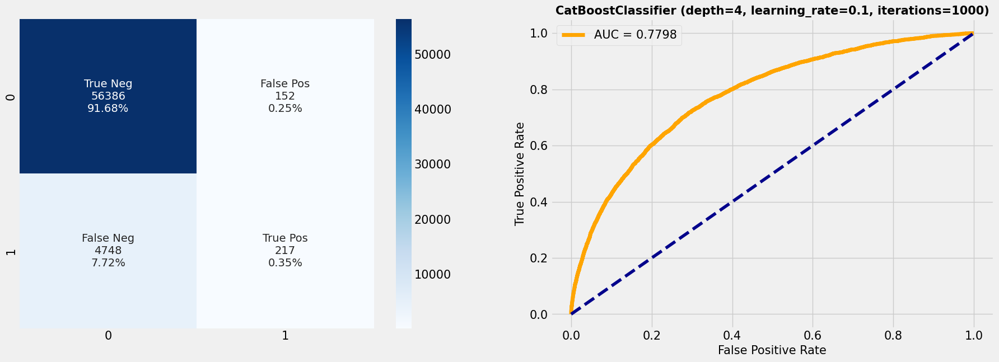

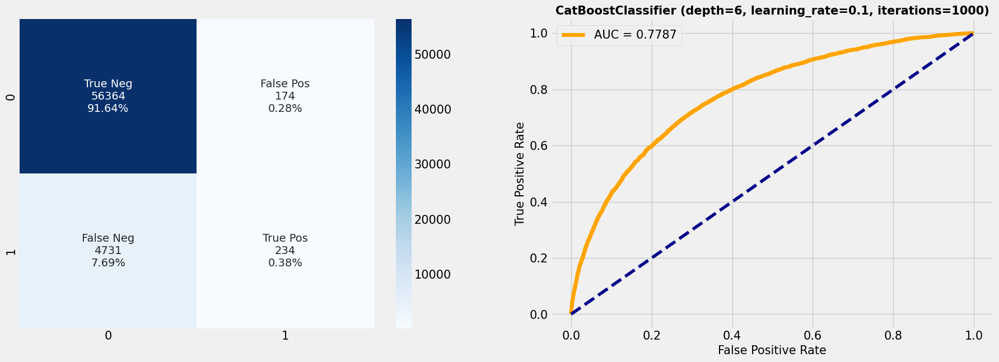

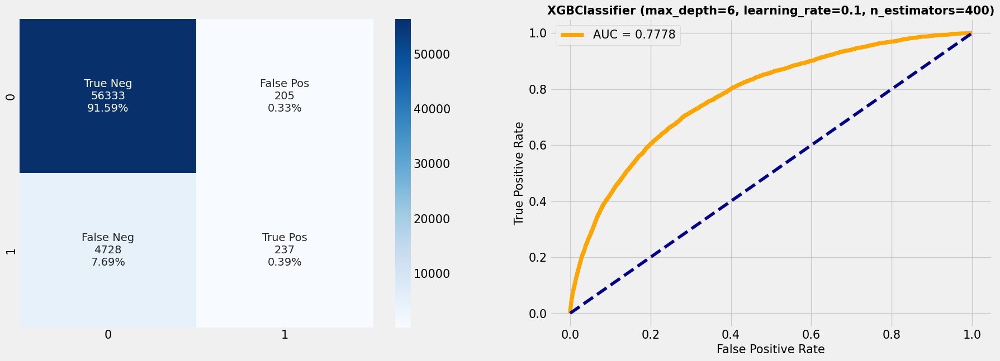

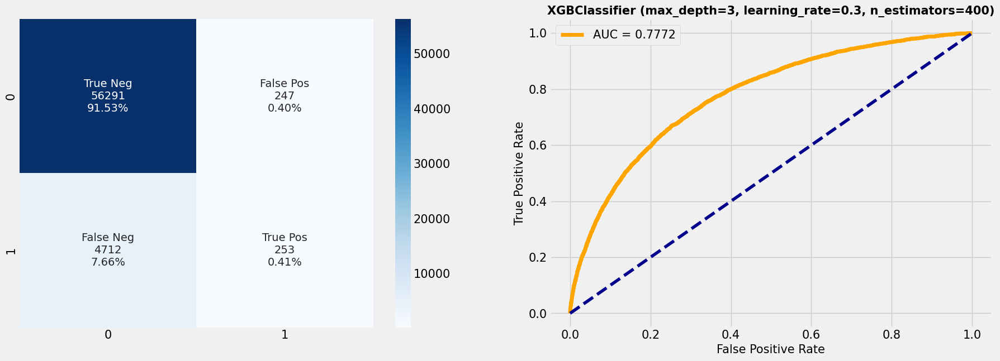

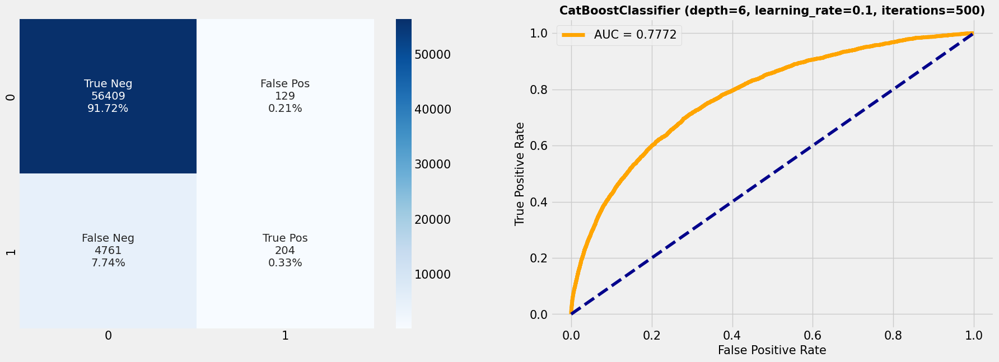

...

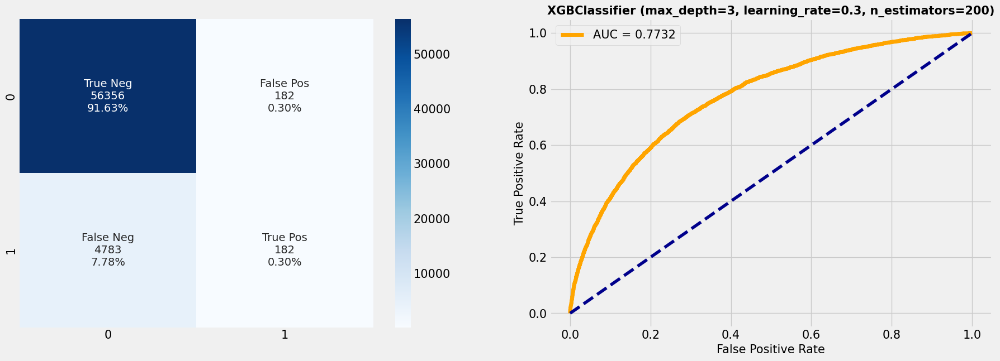

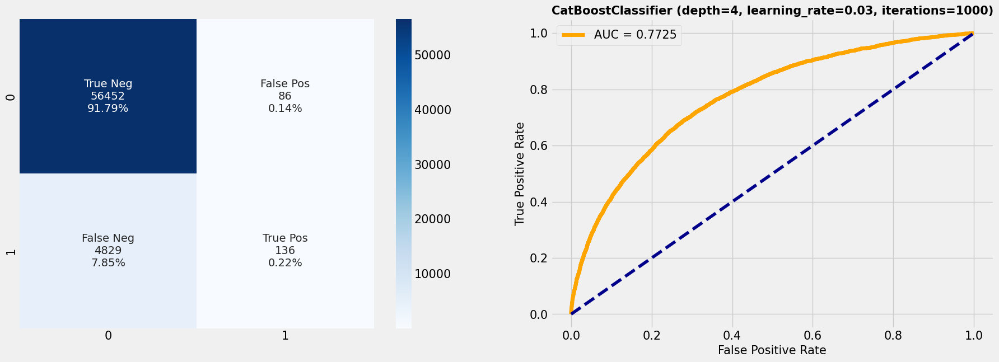

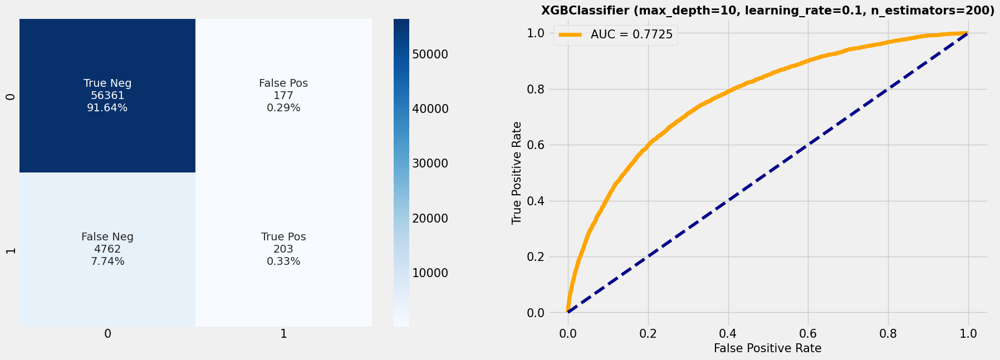

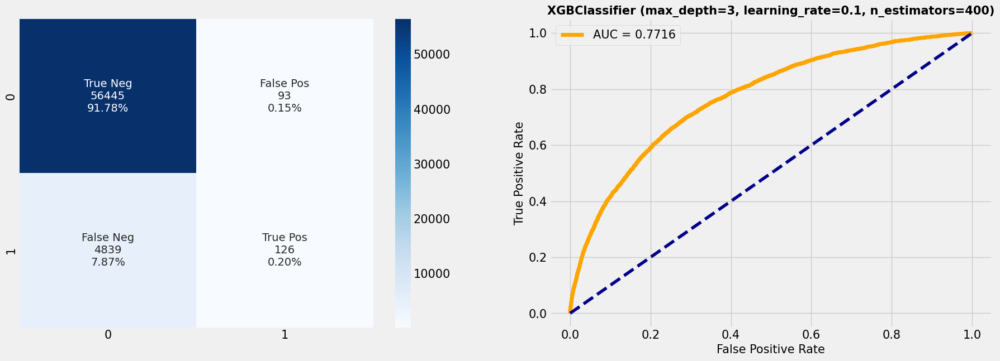

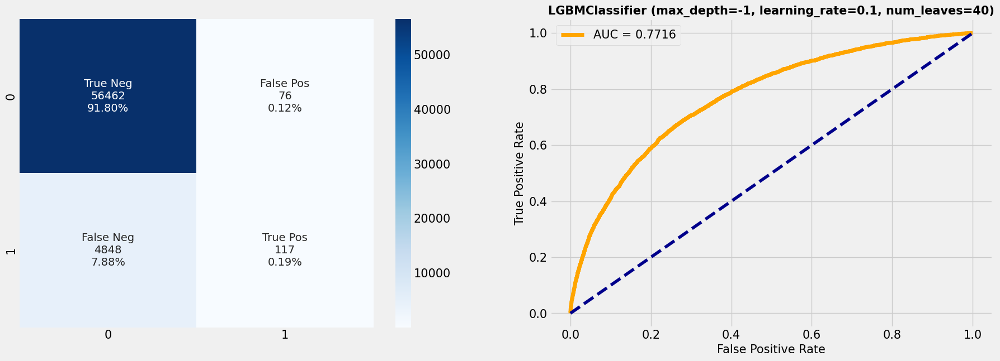

In [ ]:
for model_index in base_models_res.head(15)['Trained_Model'].index:
  model = base_models_res.head(15)['Trained_Model'][model_index]
  AUC = base_models_res.head(15)['AUC'][model_index]
  cf_matrix_roc_auc(model, y_test, model.predict(X_test), model.predict_proba(X_test)[:,1], AUC)

Performances are equal (a bit worse) and the time processing is much longer : using oversampling is useless here.

#### Specific case : Catboost with non encoded variables

In [ ]:
# Added cat_features (need to be given to catboost)
def train_models_cat(model, X_train, X_test, y_train, y_test, cat_features_indices):
    model.fit(X_train, y_train, cat_features=cat_features_indices)
    output = {
      'AUC': roc_auc_score(y_test, model.predict_proba(X_test)[:,1]),
      'Accuracy': accuracy_score(y_test, model.predict(X_test)),
      'Precision': precision_score(y_test, model.predict(X_test)),
      'Recall': recall_score(y_test, model.predict(X_test)),
      'F1': f1_score(y_test, model.predict(X_test))
      }

    return output

In [ ]:
data_no_pre_processing = pd.read_csv('merged_data.zip', compression='zip').dropna(subset=['TARGET'])

In [ ]:
TARGET_cat = data_no_pre_processing['TARGET']

In [ ]:
data_no_pre_processing.drop(columns=['TARGET'], inplace=True)

In [ ]:
cat_features = data_no_pre_processing.select_dtypes(include=['object']).columns.tolist()
cat_features_indices = [data_no_pre_processing.columns.get_loc(col) for col in cat_features]

In [ ]:
data_no_pre_processing[cat_features] = data_no_pre_processing[cat_features].fillna("missing")

In [ ]:
X_train_no_pre_processing, X_test_no_pre_processing, y_train_no_pre_processing, y_test_no_pre_processing = train_test_split(
    data_no_pre_processing.values, TARGET_cat.values, test_size=0.2, random_state=42, stratify=TARGET_cat.values )

Model 1/8 : completed.
Model 2/8 : completed.
Model 3/8 : completed.
Model 4/8 : completed.
Model 5/8 : completed.
Model 6/8 : completed.
Model 7/8 : completed.
Model 8/8 : completed.
CPU times: user 2h 13min 48s, sys: 2min 30s, total: 2h 16min 19s
Wall time: 1h 24min 52s


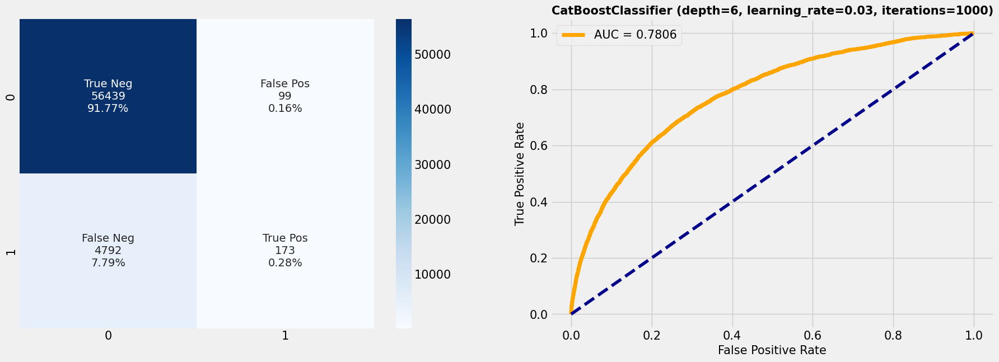

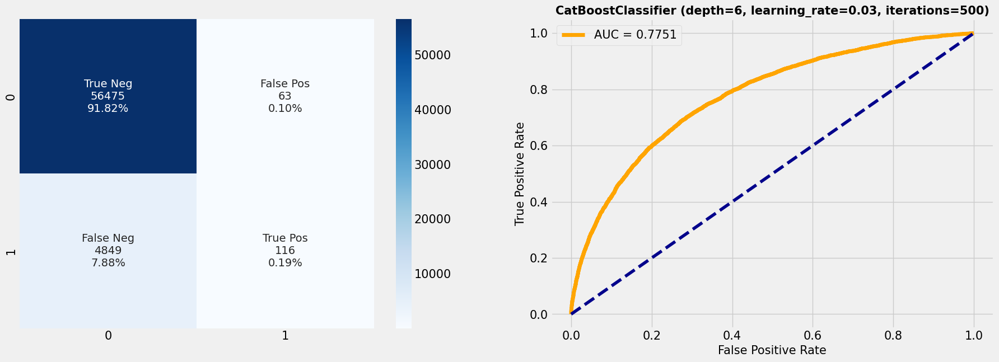

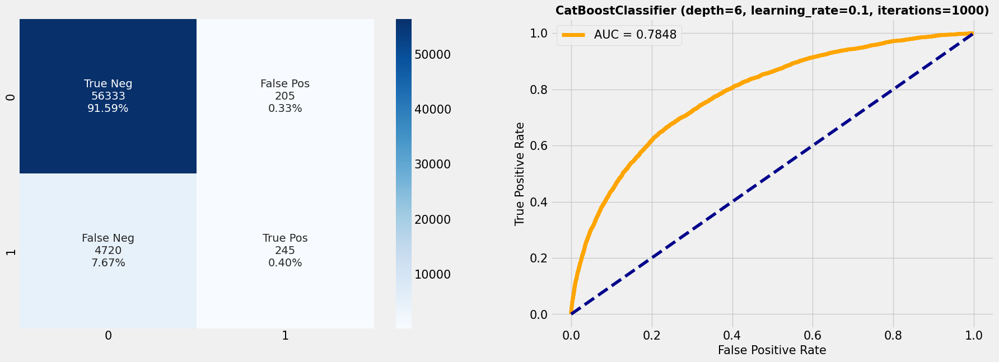

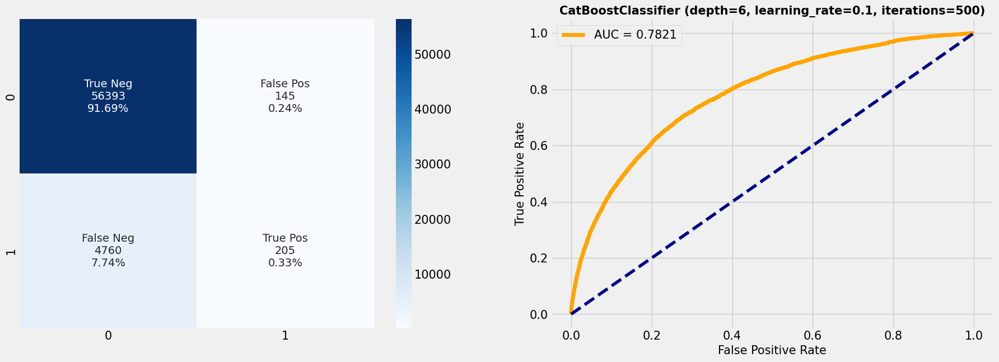

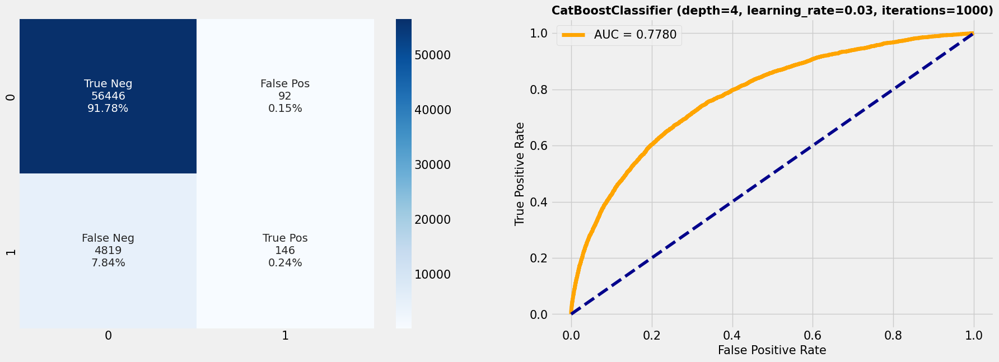

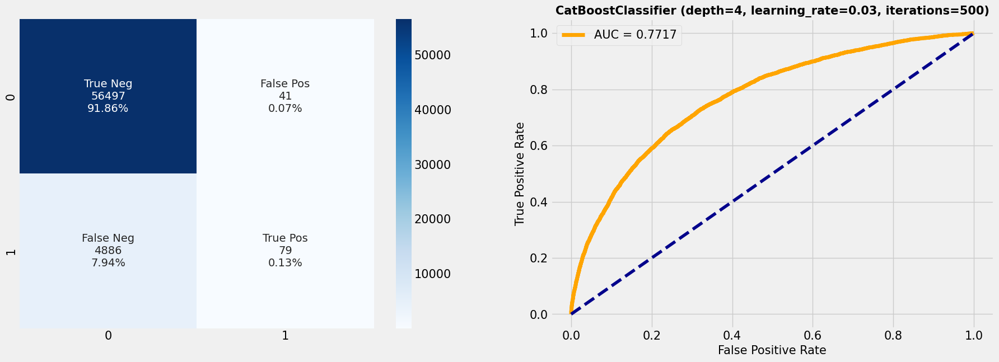

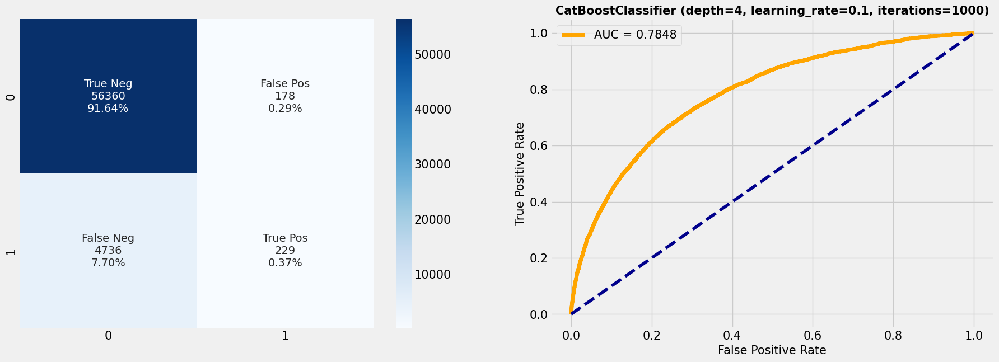

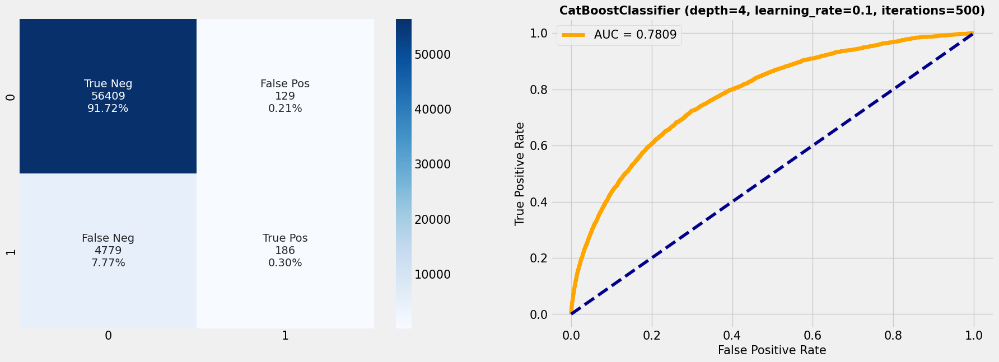

In [ ]:
%%time

name = []
auc = []
accuracy = []
precision = []
recall = []
f1 = []
time_ = []
plt_titles = []
trained_models = []

count = 0
for model in catboost_models:
    count += 1
    start = time.time()
    results = train_models_cat(model, X_train_no_pre_processing, X_test_no_pre_processing, y_train_no_pre_processing, y_test_no_pre_processing, cat_features_indices)

    name.append(type(model).__name__)
    auc.append(results['AUC'])
    accuracy.append(results['Accuracy'])
    precision.append(results['Precision'])
    recall.append(results['Recall'])
    f1.append(results['F1'])
    time_.append(time.time()-start)
    trained_models.append(model)

    plt_title = cf_matrix_roc_auc(model, y_test_no_pre_processing, model.predict(X_test_no_pre_processing), model.predict_proba(X_test_no_pre_processing)[:,1],
                      results['AUC'])
    plt_titles.append(plt_title)
    print(f"Model {count}/{len(catboost_models)} : completed.")

In [ ]:
#Initialise data of lists
catboost_optimized_models = pd.DataFrame(data=[name, auc, accuracy, precision, recall, f1, time_, plt_titles, trained_models]).T
catboost_optimized_models.columns = ['Model', 'AUC', 'Accuracy', 'Precision', 'Recall', 'F1', 'Time', 'Title','Trained_Model']
catboost_optimized_models.sort_values('AUC', ascending=False, inplace=True)

In [ ]:
catboost_optimized_models.head(5)

,Model,AUC,Accuracy,Precision,Recall,F1,Time,Title,Trained_Model
2,CatBoostClassifier,0.784794,0.919923,0.544444,0.049345,0.090489,977.163069,"CatBoostClassifier (depth=6, learning_rate=0.1, iterations=1000)",<catboost.core.CatBoostClassifier object at 0x7e7148fdc350>
6,CatBoostClassifier,0.784776,0.920101,0.562654,0.046123,0.085257,646.898634,"CatBoostClassifier (depth=4, learning_rate=0.1, iterations=1000)",<catboost.core.CatBoostClassifier object at 0x7e7148fdc410>
3,CatBoostClassifier,0.782124,0.920248,0.585714,0.041289,0.07714,515.069576,"CatBoostClassifier (depth=6, learning_rate=0.1, iterations=500)",<catboost.core.CatBoostClassifier object at 0x7e7148fdc310>
7,CatBoostClassifier,0.780906,0.920199,0.590476,0.037462,0.070455,369.198055,"CatBoostClassifier (depth=4, learning_rate=0.1, iterations=500)",<catboost.core.CatBoostClassifier object at 0x7e7148fdc490>
0,CatBoostClassifier,0.780551,0.920475,0.636029,0.034844,0.066068,982.129946,"CatBoostClassifier (depth=6, learning_rate=0.03, iterations=1000)",<catboost.core.CatBoostClassifier object at 0x7e7148fc69d0>


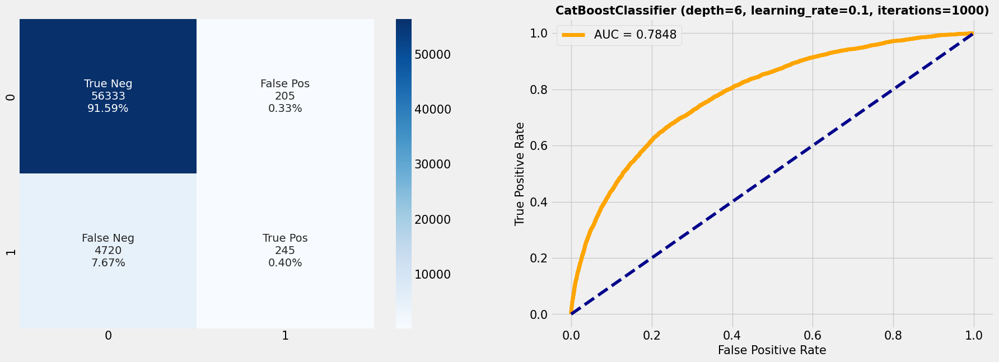

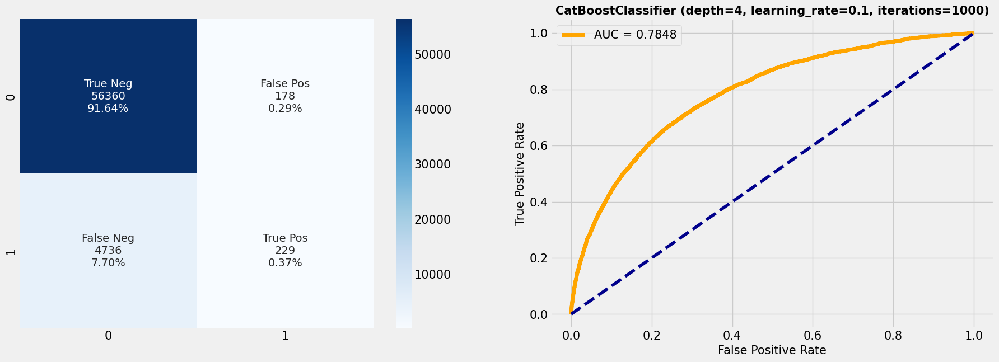

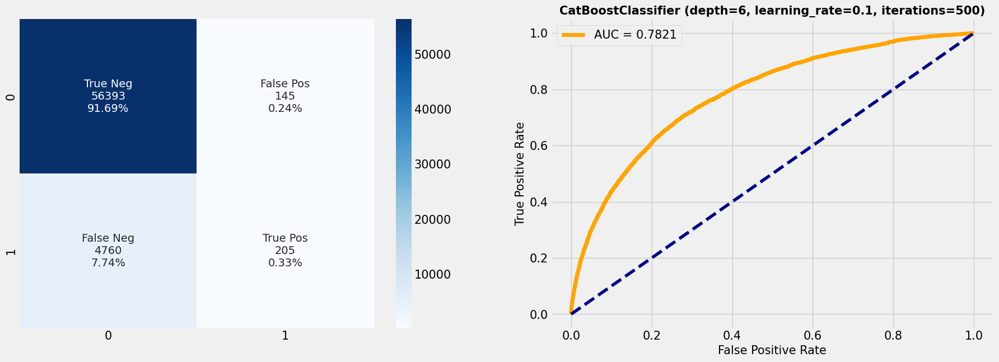

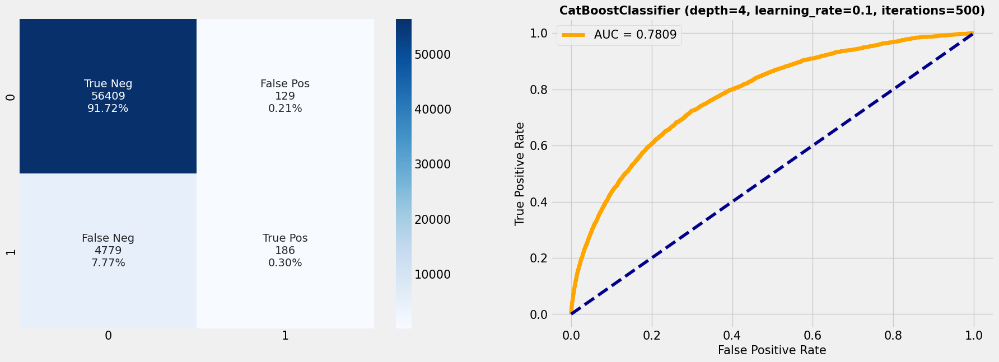

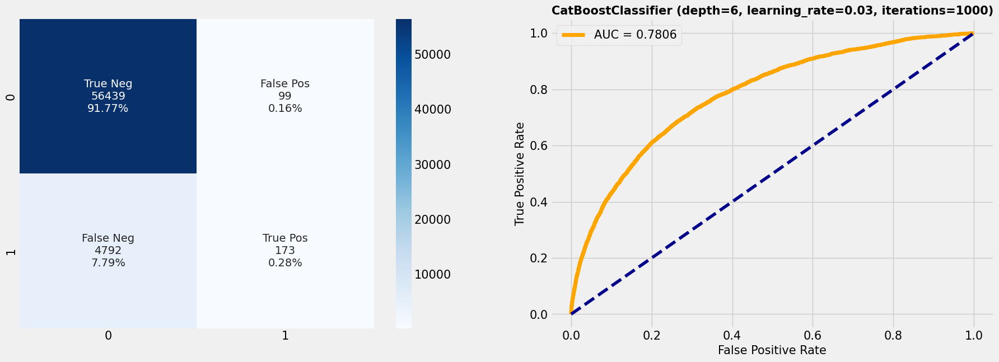

In [ ]:
for model_index in catboost_optimized_models.head(5)['Trained_Model'].index:
  model = catboost_optimized_models.head(5)['Trained_Model'][model_index]
  AUC = catboost_optimized_models.head(5)['AUC'][model_index]
  cf_matrix_roc_auc(model, y_test_no_pre_processing, model.predict(X_test_no_pre_processing), model.predict_proba(X_test_no_pre_processing)[:,1], AUC)

Performances are worse than using manually encoded features. And processing times are higher : forget this option

#### Best Model

add gridsearchCV here to find best XGBoost model

In [100]:
# Basic model XGBoost
xgb_model = XGBClassifier(
    random_state=42,
    use_label_encoder=False,
    tree_method="gpu_hist" if "gpu_use" in globals() and gpu_use else "hist",
    predictor="gpu_predictor" if "gpu_use" in globals() and gpu_use else "cpu_predictor"
)

# Define a grid around the best observed parameters
param_grid = {
    'max_depth': [3, 5],  # Fixé à 3 car ce paramètre fonctionne bien (cf vos tests)
    'learning_rate': [0.25, 0.3, 0.35],  # Ajuster autour de 0.3
    'n_estimators': [300, 400, 500],     # Affiner autour de 400
    # You can add other parameters here if required (e.g. subsample, colsample_bytree)
}

# GridSearchCV configuration, optimizing for AUC
grid_search = GridSearchCV(
    estimator=xgb_model,
    param_grid=param_grid,
    scoring='roc_auc',  # Hyperparameters tuning and research will be focused on AUC optimization
    cv=5,               # 5-fold cross-validation
    verbose=2,
    n_jobs=-1           # Use all available cores for parallel computing
)

In [ ]:
# Train your grid on the training set
grid_search.fit(X_train, y_train)

# Results: Best parameters and best validation score
print("Best parameters :", grid_search.best_params_)
print("Best AUC score (cross-validation) :", grid_search.best_score_)

# Optimal model
best_model = grid_search.best_estimator_

# Evaluate test set
y_pred_proba = best_model.predict_proba(X_test)[:, 1]
test_auc = roc_auc_score(y_test, y_pred_proba)
print("AUC on test set :", test_auc)


Fitting 5 folds for each of 18 candidates, totalling 90 fits
Best parameters : {'learning_rate': 0.25, 'max_depth': 3, 'n_estimators': 300}
Best AUC score (cross-validation) : 0.7755720150421903


'XGBClassifier (max_depth=3, learning_rate=0.25, n_estimators=300)'

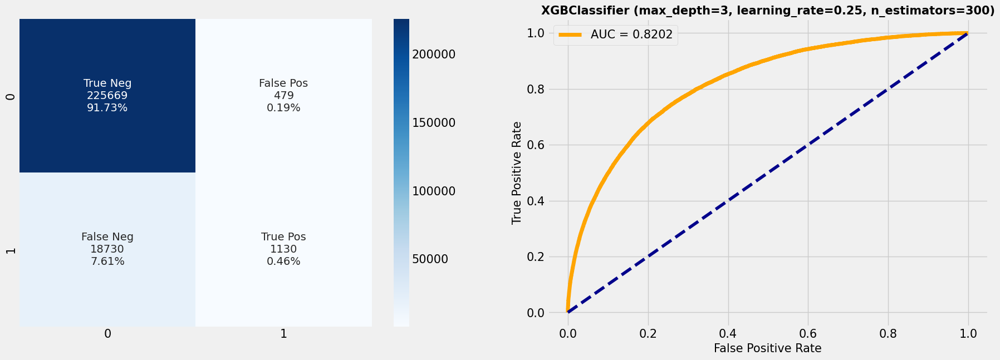

In [19]:
cf_matrix_roc_auc(best_model, y_train, best_model.predict(X_train), best_model.predict_proba(X_train)[:,1],
                      roc_auc_score(y_train, best_model.predict_proba(X_train)[:,1]))

'XGBClassifier (max_depth=3, learning_rate=0.25, n_estimators=300)'

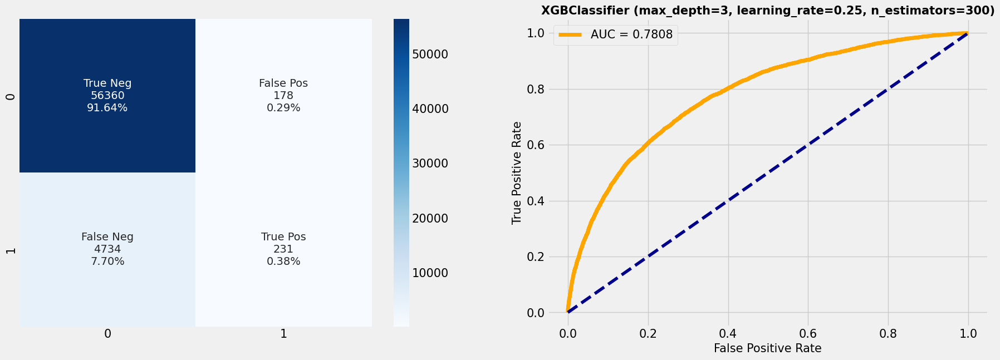

In [20]:
cf_matrix_roc_auc(best_model, y_test, best_model.predict(X_test), best_model.predict_proba(X_test)[:,1],
                      roc_auc_score(y_test, best_model.predict_proba(X_test)[:,1]))

### Cost function (model tuning)
Goal here is to determine a probability threshold in order to minimize false negatives (loan is accorded but will not be refunded).\
We will chose a cost function :\
$ \text{Total Cost} = 10 \times \text{FN} + 1 \times \text{FP} $


In [21]:
from machine_learning_functions import binar_cost_function

In [22]:
# Prédictions probabilistes sur validation set
y_proba = best_model.predict_proba(X_test)[:, 1]

In [23]:
best_model.predict_proba(X_test)

array([[0.98294955, 0.01705046],
       [0.9504215 , 0.04957847],
       [0.7237731 , 0.27622688],
       ...,
       [0.9752942 , 0.02470581],
       [0.8446625 , 0.15533751],
       [0.89245623, 0.10754374]], dtype=float32)

In [24]:
# Calculate costs for all possible thresholds
thresholds = np.linspace(0, 1, 100)  # 100 thresholds tested
costs = []

for thresh in thresholds:
    y_pred_thresh = (y_proba >= thresh).astype(int)
    cost = binar_cost_function(y_test, y_pred_thresh, fn_cost=10)
    costs.append(cost)

In [25]:
# Find the optimal threshold
optimal_threshold = thresholds[np.argmin(costs)]

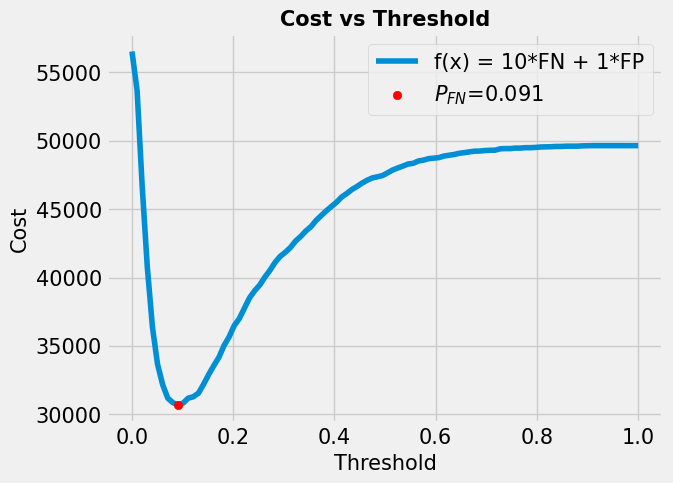

In [70]:
plt.plot(thresholds, costs, zorder=1, label='f(x) = 10*FN + 1*FP')
plt.scatter(optimal_threshold, binar_cost_function(y_test, (y_proba >= optimal_threshold).astype(int), fn_cost=10), color='red', label = r'$P_{FN}$'+f'={optimal_threshold:.3f}', zorder=2)
plt.xlabel('Threshold')
plt.ylabel('Cost')
plt.title('Cost vs Threshold')
plt.legend()

In [26]:
optimal_threshold

np.float64(0.09090909090909091)

In [27]:
# == 1 if >= optimal_threshold
y_pred_optimal = (y_proba >= optimal_threshold).astype(int)

'XGBClassifier (max_depth=3, learning_rate=0.25, n_estimators=300)'

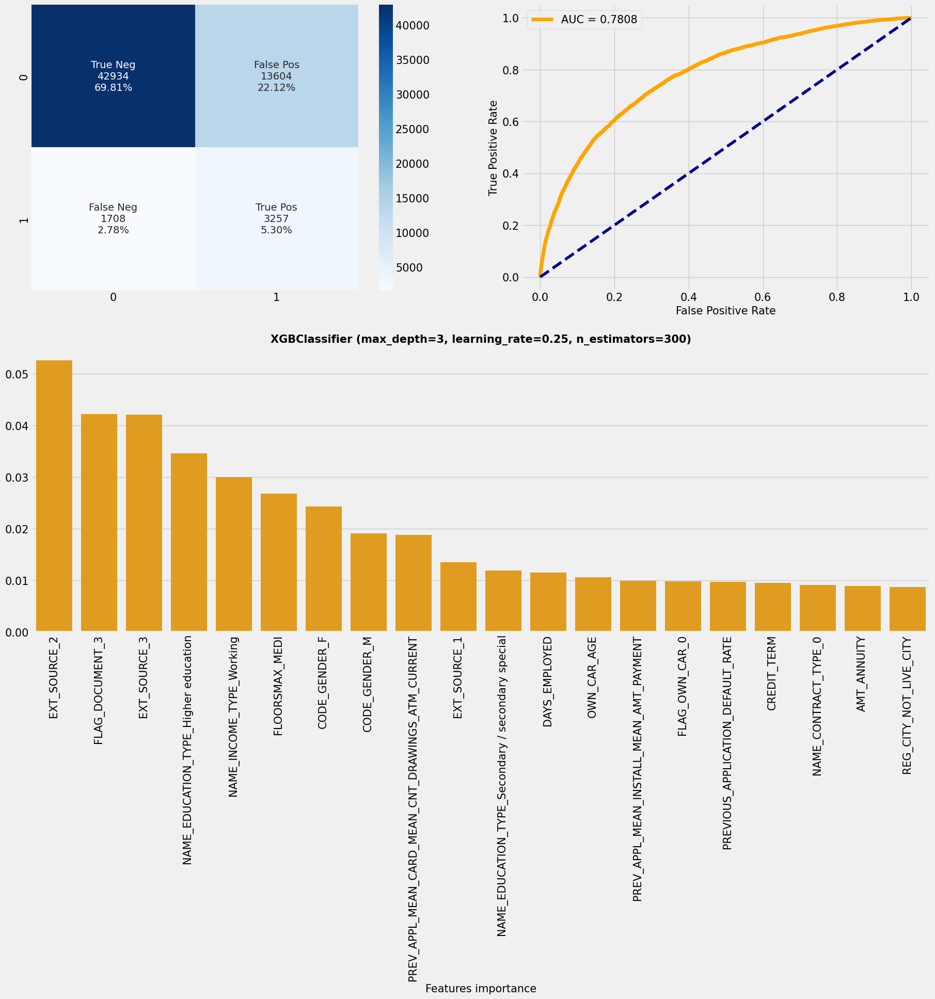

In [53]:
cf_matrix_roc_auc(best_model, y_test, y_pred_optimal, y_proba, roc_auc_score(y_test, y_proba), feature_importances=True, data_train=data_train)

### Feature Importance

#### Global explanation

In [47]:
!pip install shap

In [48]:
import shap

# Shap will compute features contribution for each of the classes inside of the best_model.classes_ list.
explainer = shap.TreeExplainer(best_model)  # for RandomForest/XGBoost
# In binary context (only two possible values), there will be only one shap matrix, based on the contribution for the second value of the 2 elements list
# With k classes (k>2), k matrix will be computed in order to describe each feature contribution for each potential class
shap_values = explainer.shap_values(X_train)

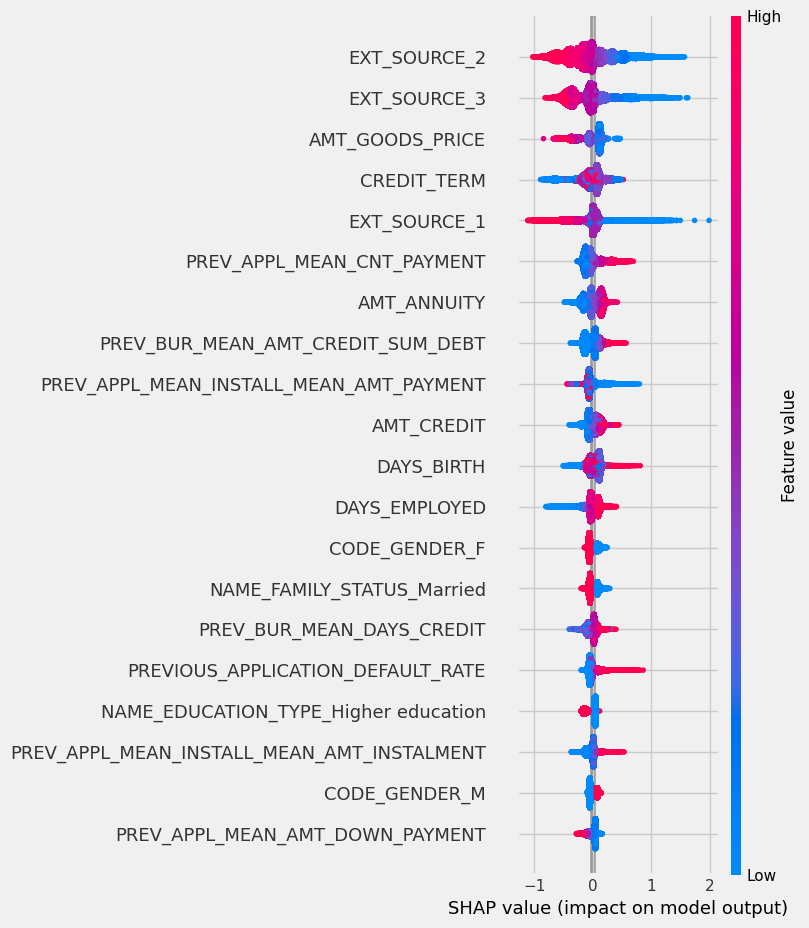

In [49]:
# Global view
shap.summary_plot(shap_values, X_train, feature_names=data_train.columns)

#### Local explanation

In [29]:
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 5.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=aea58016ad66b3d081687d713d0fcdb61813b3141cd89b1d4a659c10954bdabe
  Stored in directory: /root/.cache/pip/wheels/85/fa/a3/9c2d44c9f3cd77cf4e533b58900b2bf4487f2a17e8ec212a3d
Successfully built lime


In [32]:
from lime.lime_tabular import LimeTabularExplainer

explainer_lime = LimeTabularExplainer(
    training_data=X_train,
    feature_names=data_train.columns.tolist(),
    class_names=["Positive", "Negative"],
    mode="classification",
    discretize_continuous=True,  # To group continuous values
    random_state=42
)


In [33]:
best_model.classes_

array([0, 1])

In [34]:
optimal_threshold

np.float64(0.09090909090909091)

Accepted loan example

In [49]:
# Specific instance to be explained (customer refused)
client_idx = np.where(y_pred_optimal==0)[0][34]
exp = explainer_lime.explain_instance(
    X_test[client_idx],
    best_model.predict_proba,
    num_features=10,
    top_labels=1
)

In [50]:
y_pred_optimal[client_idx]

np.int64(0)

In [51]:
exp.show_in_notebook(show_table=True, show_all=False)

In [43]:
# Export HTML for sharing
# exp.save_to_file(f"explication_client_{client_idx}.html")

Refused loan example

In [44]:
# Specific instance to be explained (customer refused)
client_idx = np.where(y_pred_optimal==1)[0][0]
exp = explainer_lime.explain_instance(
    X_test[client_idx],
    best_model.predict_proba,
    num_features=10,
    top_labels=1
)

In [45]:
y_pred_optimal[client_idx]

np.int64(1)

In [46]:
exp.show_in_notebook(show_table=True, show_all=False)

In [47]:
# Export HTML for sharing
# exp.save_to_file(f"explication_client_{client_idx}.html")

#### Model simplification

This part is optionnal but still very interesting in order to optimize model performances (both regarding computing time AND predicting results)

In [19]:
from machine_learning_functions import model_reduction

In [20]:
highest_gain_variables_number = 100

In [39]:
AUC = [roc_auc_score(y_test, best_model.predict_proba(X_test)[:,1])]
highest_gain_features_numbers = [len(data_train.columns)]
models = [best_model]
for highest_gain_features_number in range(20,140,20):
  print(f"Number of parameters: {highest_gain_features_number}")
  auc_reduced, reduced_model, top_vars = model_reduction(data_train.columns, X_train, X_test, y_train, y_test, best_model, highest_gain_features_number)
  AUC.append(auc_reduced)
  highest_gain_features_numbers.append(highest_gain_features_number)
  models.append(reduced_model)

Number of parameters: 20
Full model AUC : 0.7808 | Reduced model AUC : 0.7674
Number of parameters: 40
Full model AUC : 0.7808 | Reduced model AUC : 0.7766
Number of parameters: 60
Full model AUC : 0.7808 | Reduced model AUC : 0.7816
Number of parameters: 80
Full model AUC : 0.7808 | Reduced model AUC : 0.7792
Number of parameters: 100
Full model AUC : 0.7808 | Reduced model AUC : 0.7795
Number of parameters: 120
Full model AUC : 0.7808 | Reduced model AUC : 0.7817


In [40]:
model_simplification_df = pd.DataFrame(data=[AUC, highest_gain_features_numbers]).T
model_simplification_df.columns = ['AUC', 'Number of parameters']
model_simplification_df.sort_values('Number of parameters', ascending=True, inplace=True)

In [42]:
model_simplification_df[['AUC','Number of parameters']]

,AUC,Number of parameters
1,0.767419,20.0
2,0.776646,40.0
3,0.781598,60.0
4,0.779208,80.0
5,0.779474,100.0
6,0.781704,120.0
0,0.780771,316.0


In [61]:
model_simplification_df['Number of parameters'].idxmax()

np.int64(0)

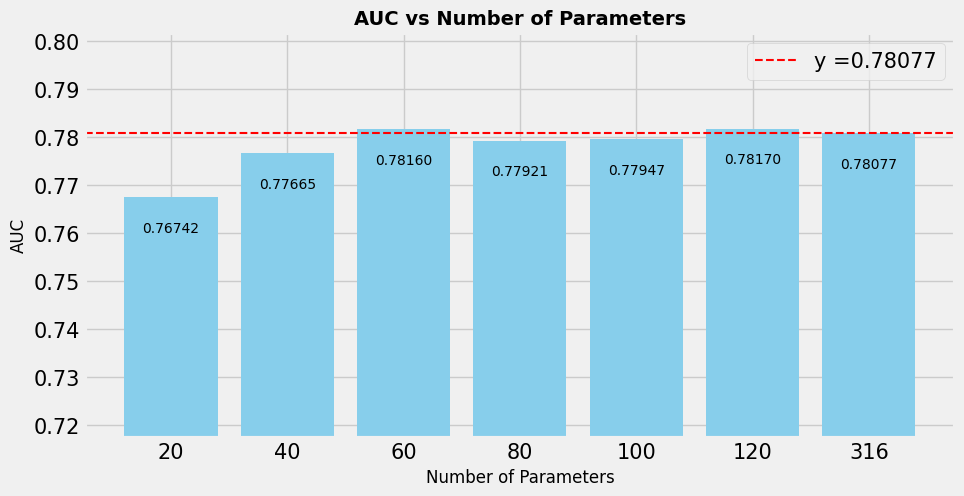

In [74]:
# Data
auc = model_simplification_df['AUC']
number_of_parameters = model_simplification_df['Number of parameters']

# Indices pour un espacement uniforme
indices = range(len(number_of_parameters))

# Création du graphique en barres
plt.figure(figsize=(10, 5))
bars = plt.bar(indices, auc, color='skyblue', width=0.8)

# Ajouter les valeurs de l'AUC à l'intérieur des barres
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval - 0.005,  # changed here
             f'{yval:.5f}', ha='center', va='top', color='black', fontsize=10) # changed here


# Ajouter une ligne horizontale à pour AUC avant reduction de paramètres
AUC_without_reduction = model_simplification_df.loc[model_simplification_df['Number of parameters'].idxmax()]['AUC']
plt.axhline(y=AUC_without_reduction, color='red', linestyle='--', linewidth=1.5, label=f'y ={AUC_without_reduction:.5f}')


# Labels et Titre
plt.xlabel('Number of Parameters', fontsize=12)
plt.ylabel('AUC', fontsize=12)
plt.title('AUC vs Number of Parameters', fontsize=14)
plt.legend()

# Espacement uniforme des étiquettes
plt.xticks(indices, labels=[str(int(param)) for param in number_of_parameters])

# Ajuster les limites sur l'axe Y
plt.ylim(min(AUC)-0.05, max(AUC)+0.02)  # Définir une fenêtre spécifique pour y-min et y-max

# Afficher le graphique
plt.show()

In [76]:
auc_reduced, reduced_model, top_vars = model_reduction(data_train.columns, X_train, X_test, y_train, y_test, best_model, 60)

Full model AUC : 0.7808 | Reduced model AUC : 0.7816


In [77]:
print(top_vars)

                                               variable     gains
29                                         EXT_SOURCE_2  0.052593
80                                      FLAG_DOCUMENT_3  0.042188
30                                         EXT_SOURCE_3  0.042152
202                NAME_EDUCATION_TYPE_Higher education  0.034607
200                            NAME_INCOME_TYPE_Working  0.030012
66                                       FLOORSMAX_MEDI  0.026860
181                                       CODE_GENDER_F  0.024367
182                                       CODE_GENDER_M  0.019139
156   PREV_APPL_MEAN_CARD_MEAN_CNT_DRAWINGS_ATM_CURRENT  0.018859
28                                         EXT_SOURCE_1  0.013483
205   NAME_EDUCATION_TYPE_Secondary / secondary special  0.011950
8                                         DAYS_EMPLOYED  0.011559
11                                          OWN_CAR_AGE  0.010667
168             PREV_APPL_MEAN_INSTALL_MEAN_AMT_PAYMENT  0.009921
183       

In [81]:
top_vars.index

Index([ 29,  80,  30, 202, 200,  66, 181, 182, 156,  28, 205,   8,  11, 168,
       183, 122, 177, 179,   4,  25, 207, 157,  75, 220, 126,   7,   3,  20,
       311, 153, 135, 107, 114,   5, 284, 197, 176, 116, 113, 103, 111,  62,
       139,  77, 185, 247,  10, 249, 154, 164, 145, 123, 178, 152, 150, 115,
       270,  46, 104, 138],
      dtype='int64')

In [83]:
X_train[:,top_vars.index]

array([[0.33868167, 1.        , 0.69503858, ..., 0.1673    , 0.04      ,
        0.20379469],
       [0.60147522, 1.        , 0.59716311, ..., 0.0746    , 0.04      ,
        0.00746113],
       [0.56948111, 1.        , 0.66824209, ..., 0.1166    , 0.08      ,
        0.00110857],
       ...,
       [0.54031101, 0.        , 0.76242889, ..., 0.3139    , 0.04      ,
        0.00452667],
       [0.53704492, 1.        , 0.90710375, ..., 0.0746    , 0.2       ,
        0.00611508],
       [0.00955721, 1.        , 0.75542001, ..., 0.0746    , 0.12      ,
        0.14843416]])

'XGBClassifier (max_depth=3, learning_rate=0.25, n_estimators=300)'

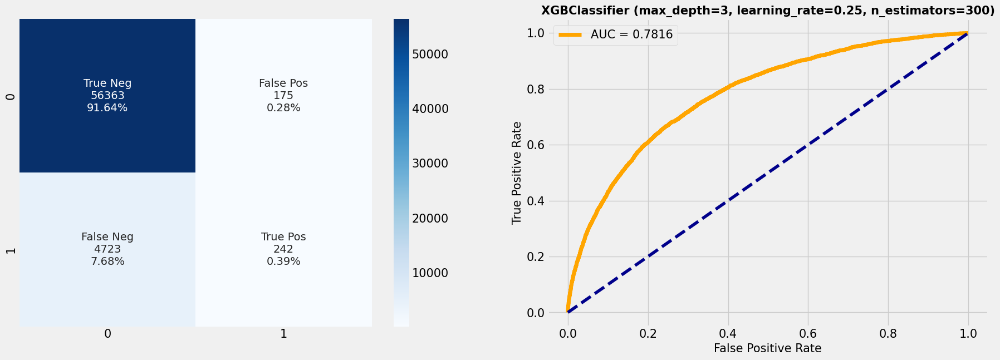

In [86]:
cf_matrix_roc_auc(reduced_model, y_test, reduced_model.predict(X_test[:,top_vars.index]), reduced_model.predict_proba(X_test[:,top_vars.index])[:,1], auc_reduced)

In [88]:
# Prédictions probabilistes sur validation set
y_proba = reduced_model.predict_proba(X_test[:,top_vars.index])[:, 1]

In [90]:
reduced_model.predict_proba(X_test[:,top_vars.index])

array([[0.9829007 , 0.01709932],
       [0.96314937, 0.03685062],
       [0.71744984, 0.28255016],
       ...,
       [0.9833945 , 0.01660548],
       [0.8176993 , 0.18230066],
       [0.90814716, 0.09185284]], dtype=float32)

In [93]:
# Étape 2: Calculer les coûts pour tous les seuils possibles
thresholds = np.linspace(0, 1, 100)  # 100 seuils testés
costs = []

for thresh in thresholds:
    y_pred_thresh = (y_proba >= thresh).astype(int)
    cost = binar_cost_function(y_test, y_pred_thresh, fn_cost=10)
    costs.append(cost)

In [94]:
# Étape 3: Trouver le seuil optimal
optimal_threshold = thresholds[np.argmin(costs)]

In [95]:
optimal_threshold

np.float64(0.09090909090909091)

In [96]:
# == 1 if >= optimal_threshold
y_pred_optimal = (y_proba >= optimal_threshold).astype(int)

'XGBClassifier (max_depth=3, learning_rate=0.25, n_estimators=300)'

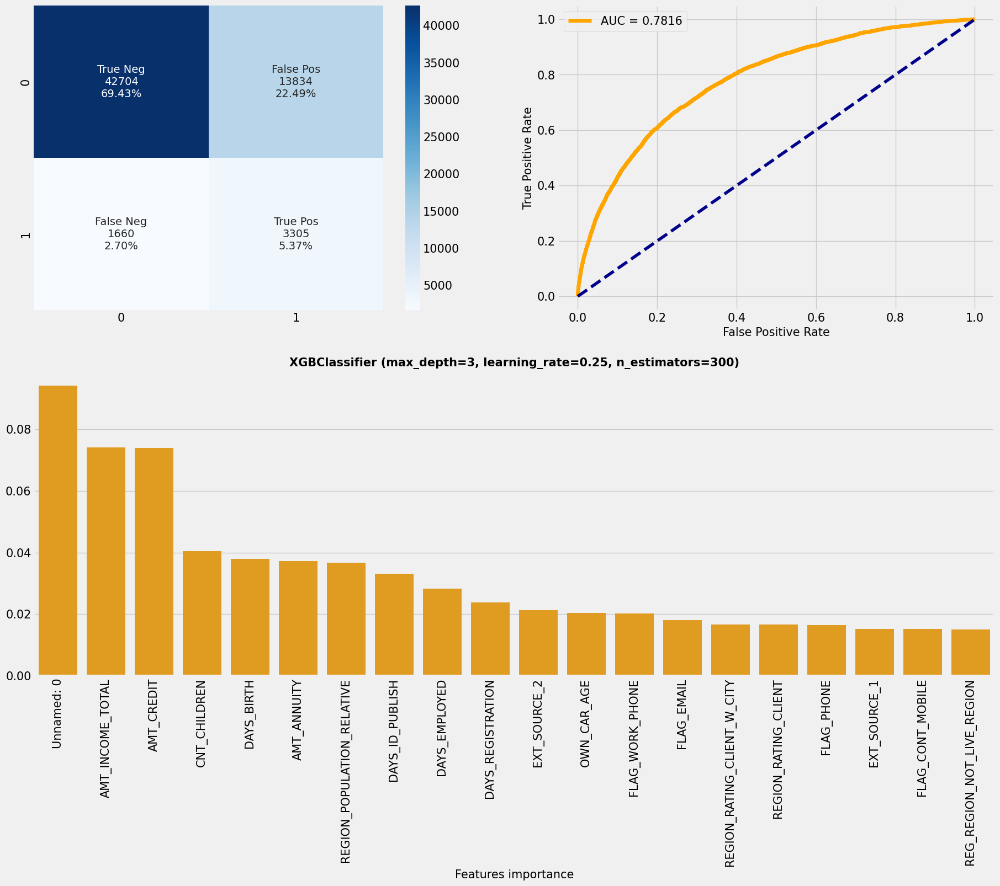

In [99]:
cf_matrix_roc_auc(reduced_model, y_test, y_pred_optimal, y_proba, roc_auc_score(y_test, y_proba), feature_importances=True, data_train=data_train)